<h1><Center>Generative Adverserial Network</Center></h1>

Name: Marcus Loo and Xander Lim

Admin Number: P1234567, P2204286

Class: DAAA/FT/2B/05

## What are GANs?

Generative Adversarial Networks, or GANs for short, are an approach to generative modeling using deep learning methods, such as convolutional neural networks.

Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset.

References: https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/

## Objective of this assignment

In this assignment, we are going to apply some suitable GAN architectures to the problem of image generation.

We will be using the CIFAR10 dataset to create 1000 small colour images. 

Here is the code to get those images: <b>tf.keras.datasets.cifar10.load_data()</b>

## Importing Libraries

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras import Sequential, Model
from tensorflow.keras import layers, regularizers
from keras.layers import Dense, Conv2D, Reshape, UpSampling2D, BatchNormalization, Activation, Input, LeakyReLU, ZeroPadding2D, Dropout, Flatten, Conv2DTranspose, Add, Embedding, Concatenate, Normalization
from keras.datasets import mnist
from tensorflow.keras.layers import Embedding
import os
from tensorflow.keras.datasets import cifar10
from PIL import Image
from skimage.transform import resize
from scipy.linalg import sqrtm
from sklearn.metrics import pairwise_distances
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from numpy import zeros
from numpy import ones
from scipy.stats import entropy
import scipy
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras import backend as K
from tensorflow.keras.constraints import Constraint
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randn
from numpy.random import randint

from tensorflow.keras.models import load_model
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tqdm.auto import trange, tqdm

from tensorflow.keras.applications import VGG16
from tensorflow.keras.losses import MeanSquaredError

from scipy import linalg

c:\Users\Linus\anaconda3\envs\dont_touch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Checking GPU

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)

Num GPUs Available:  1


## Exploratory Data Analysis(EDA) Loading the CIFAR10 dataset and visualising it

#### Objectives and purposes
- What is the size of the dataset?
- What does the images look like?
- What is the resolution of the images?
- Is the data balanced? What is the distribution of the data?
- How can I see what the important features are?

#### Visualising data

Showing the first 10 images of each label and visualise it to give a general idea of what we are working with.




_Image preprocessing_

In order increase efficiency for our model development later on, we will be performing normalisation of the images. This will help our model reach convergence faster having to deal with smaller numbers. This also ensures a fair comparison between images and prevents overfitting.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


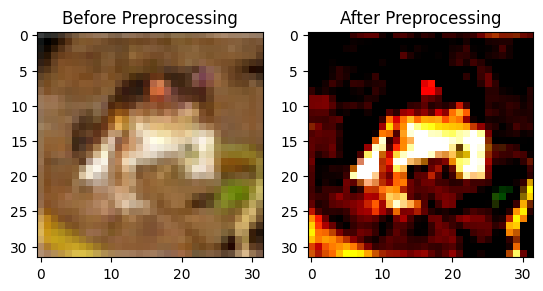

In [4]:
(X_train, labels), (_, _) = cifar10.load_data()
pre_processing_v1 = Normalization()
pre_processing_v1.adapt(X_train)
fig, ax = plt.subplots(ncols=2)

ax[0].imshow(X_train[0])
ax[0].set_title("Before Preprocessing")
ax[1].imshow(tf.squeeze(pre_processing_v1(X_train[:1, :, :])))
ax[1].set_title("After Preprocessing")
plt.show()

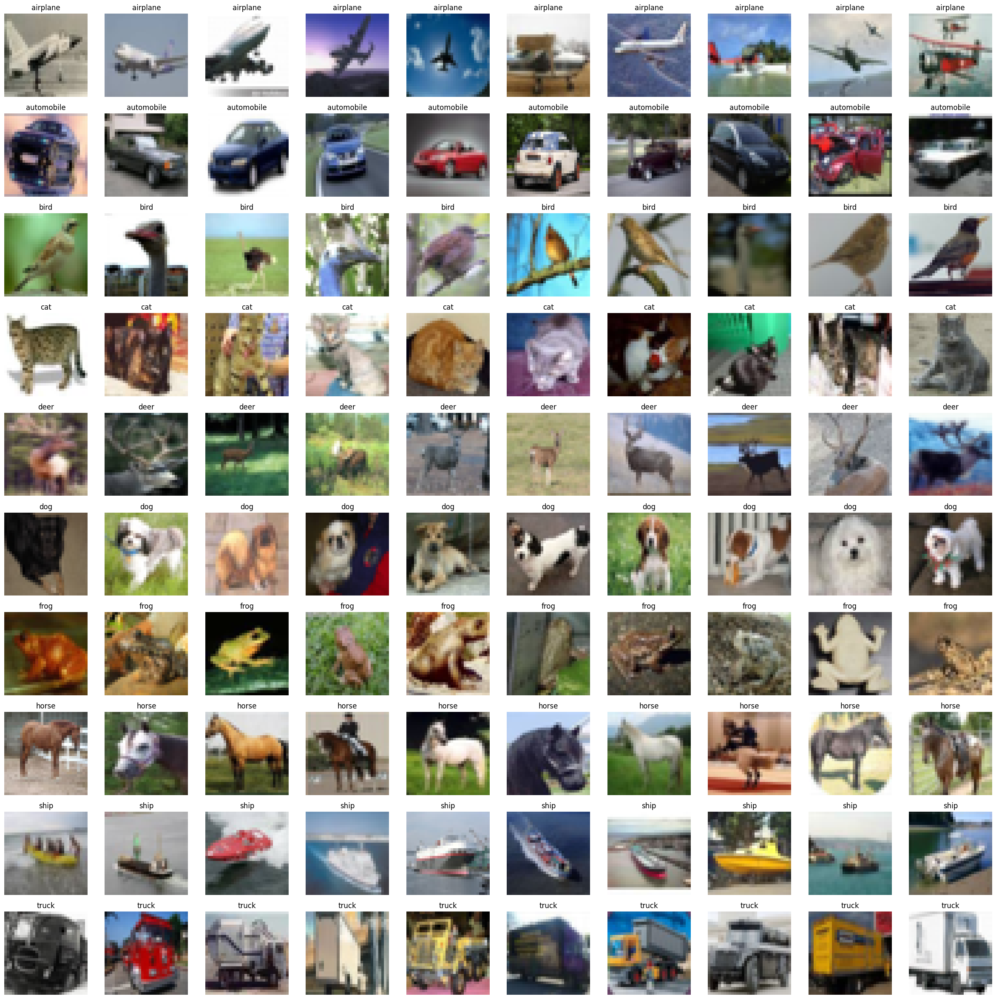

In [5]:

classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

fig, ax = plt.subplots(10, 10, figsize=(30, 30))
for i in range(10):
    images = X_train[np.squeeze(labels == i)]
    random_index = np.random.choice(images.shape[0], 10, replace=False)
    images = images[random_index]
    label = classes[i]
    for j in range(10):
        subplot = ax[i, j]
        subplot.axis("off")
        subplot.imshow(images[j])
        subplot.set_title(label)

plt.show()

##### From the images above:
- Images from the same class generally hold the same characteristics to each other
- There might be a chance that images between classes look similar, despite their classes (automobile and truck, deer and horse)

### Image Averaging

We can also take a look at the average of the image through a process called image averaging.

This process takes all the images and averages them in order to give a general display of what the class is like. There is a possibility that some images have very blury averages, but it will also be able to identify some classes that have very similar characteristics.

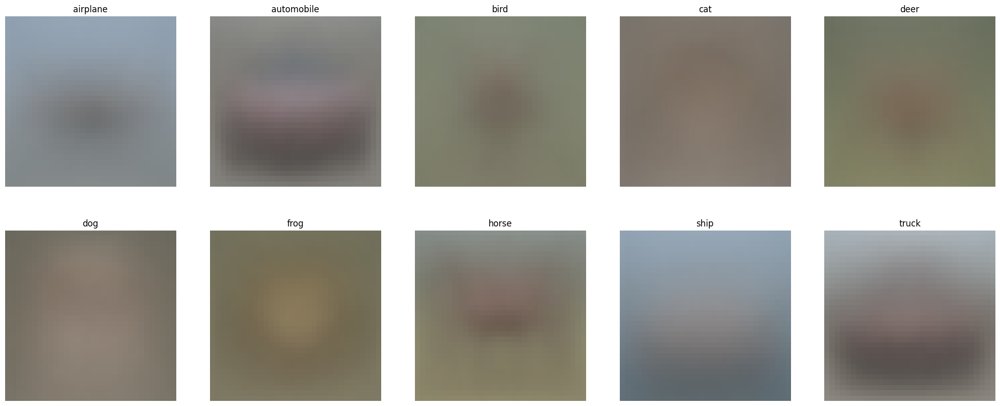

In [6]:
fig, ax = plt.subplots(2, 5, figsize=(25, 10))

for idx, subplot in enumerate(ax.ravel()):
    avg_image = np.mean(X_train[np.squeeze(labels == idx)], axis=0) / 255
    subplot.imshow(avg_image)
    subplot.set_title(f"{classes[idx]}")
    subplot.axis("off")

##### From the images above:
From this visualisation, we can see that it is very blury and difficult to make anything out of the images. However, some classes have images that we can make something out of. For example, with the labels of horse and truck, we can make out the general shape of that class. This means that generated images from the Generator model might be better than the others with a clear features.

#### Distribution of data

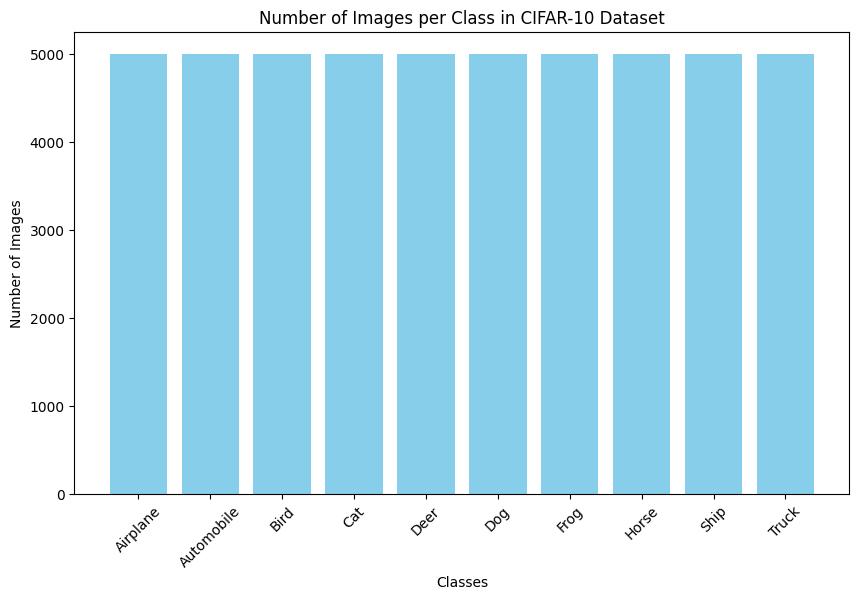

In [7]:
# Assuming labels are already loaded
labels = labels.flatten()

# Count the number of occurrences of each label
unique, counts = np.unique(labels, return_counts=True)

# Define the labels for CIFAR-10 dataset
cifar10_labels = ["Airplane", "Automobile", "Bird", "Cat", "Deer", "Dog", "Frog", "Horse", "Ship", "Truck"]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(cifar10_labels, counts, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Number of Images per Class in CIFAR-10 Dataset')
plt.xticks(rotation=45)
plt.show()


#### From the graph:
- Each class has 5000 training images
- All the classes are balanced

## Evaluation Metrics for GANs

Unlike other deep learning neural network models that are trained with a loss function until convergence, a GAN generator model is trained using a second model called a discriminator that learns to classify images as real or generated. Both the generator and discriminator model are trained together to maintain an equilibrium.

As such, there is no objective loss function used to train the GAN generator models and no way to objectively assess the progress of the training and the relative or absolute quality of the model from loss alone.

Instead, a suite of qualitative and quantitative techniques have been developed to assess the performance of a GAN model based on the quality and diversity of the generated synthetic images.

- Qualitative Evaluation metrics

1. Manual Inspection (Rating and Preference Judgment)

    These types of experiments ask subjects to rate models in terms of the fidelity of their generated images. This is where human judges are asked to rank or compare examples of real and generated images from the domain.

    A major downside of the approach is that the performance of human judges is not fixed and can improve over time. This is especially the case if they are given feedback, such as clues on how to detect generated images.


- Quantitative Evaluation metrics

1. Frechet Inception Distance (FID)
    - An implementation of an inceptionv3 model used to assess the quality of images created by GAN models 
    - FID compares the distribution of generated images with the distribution of a set of real images (ground truth)
    - A low FID score represents a good performance by the model
    - Given two multivariate Gaussian distributions with means 
    
    $\mu_1$ and $\mu_2$ and covariance matrices $\Sigma_1$ and $\Sigma_2$, the Fréchet distance is computed as follows:

    \[ FID( $\mu_1$, $\Sigma_1$, $\mu_2$, $\Sigma_2$) = $\|\mu_1$ - $\mu_2\|^2$ + $\text{Tr}($ $\Sigma_1$ + $\Sigma_2$ - $2(\Sigma_1\Sigma_2)^{1/2}) $\]

    - Where:
        - $\mu_1$ and $\mu_2$ are the mean vectors of the two distributions.
        - $\Sigma_1$ and $\Sigma_2$ are the covariance matrices of the two distributions.
        - $\|\cdot\|^2$ denotes the squared Euclidean distance between the mean vectors.
        - $\text{Tr}(\cdot)$ denotes the trace of a matrix.
        - $(\Sigma_1\Sigma_2)^{1/2}$ is the matrix square root of the product of the covariance matrices.




References:

- [How to evalute GANs (machinelearningmastery)](https://machinelearningmastery.com/how-to-evaluate-generative-adversarial-networks/)
- [Pros and Cons of GAN Evaluation measures](https://arxiv.org/abs/1802.03446)
- [GAN -How to measure GAN performance?](https://jonathan-hui.medium.com/gan-how-to-measure-gan-performance-64b988c47732)

In [8]:
def calculate_fid(inception_model, images1, images2):
    # Preprocess the images for InceptionV3
    images1 = np.array([resize(img, (299, 299, 3)) for img in images1])
    images2 = np.array([resize(img, (299, 299, 3)) for img in images2])

    # Generate InceptionV3 embeddings for the images
    embeddings1 = inception_model.predict(images1)
    embeddings2 = inception_model.predict(images2)

    # Calculate FID score
    fid = calculate_fid_score(embeddings1, embeddings2)

    return fid

def calculate_fid_score(features1, features2):
    mu1, sigma1 = features1.mean(axis=0), np.cov(features1, rowvar=False)
    mu2, sigma2 = features2.mean(axis=0), np.cov(features2, rowvar=False)

    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

    return fid
    
def plot_fid_score(fid_scores, save_path=None):

        plt.figure(figsize=(10, 6))
        plt.plot(fid_scores, label='FID Score')
        plt.xlabel('Epoch')
        plt.ylabel('Score')
        plt.title('FID Score')
        plt.legend()
        if save_path:
            plt.savefig(save_path)  # Save the plot to a file
        plt.close()

# Deep Convolutional GAN (DCGAN) Architecture

DCGAN is a GAN architecture that follows a few guidelines:

1. It replaces any pooling layers with strided convolutions (discriminator) and fractional-strided convolutions (generator).
2. It uses batch normalization in both the generator and the discriminator.
3. It removes fully connected hidden layers for deeper architectures.
4. Uses the ReLU activation function in the generator in all layers, except output, which uses tanh.
5. Uses LeakyReLU activation function in the discriminator for all layers, to solve the vanishing gradient problem.


## Building our Generator and Discriminator

### 1. Load and Prepare Dataset

We load and preprocess the CIFAR-10 dataset, converting pixel values to floats and scaling them to [-1,1].

### 2. Define the Generator and Discriminator Model

- The discriminator model is responsible for distinguishing between real and fake images. It consists of convolutional layers with LeakyReLU activation, downsampling, and a binary classification output.
- The generator model generates fake images from random noise. It comprises fully connected layers, reshaping, upsampling, and a final layer with tanh activation.

### 3. Define the GAN Model

The GAN model combines the generator and discriminator to train the generator. We freeze the discriminator's weights during this training.

### 4. Labelling Real Samples

We generate real samples from the dataset and assign them the "real" label (1). These real samples are used to train the discriminator to recognize and classify real images as 'real'.

### 5. Generate Latent Points

We generate random points in the latent space, which serve as input to the generator. The generator model in the GAN architecture takes a point from the latent space as input and generates a new image.
- The latent space itself has no meaning. Typically it is a 100-dimensional hypersphere with each variable drawn from a Gaussian distribution with a mean of zero and a standard deviation of one. Through training, the generator learns to map points into the latent space with specific output images, and this mapping will be different each time the model is trained.
- The latent space has structure when interpreted by the generator model, and this structure can be queried and navigated for a given model.
- Typically, new images are generated using random points in the latent space. Taken a step further, points in the latent space can be constructed (e.g. all 0s, all 0.5s, or all 1s) and used as input or a query to generate a specific image.

### 6. Labelling Fake Samples

After generating latent points, the generator creates fake samples from random latent points, and we assign them the "fake" label (0). These samples are used to train the discriminator to recognize and classify fake images as fake.

### 7. Train the GAN

We train the GAN model by iterating through epochs and batches, updating the discriminator and generator networks, and saving generated images at regular intervals.


**References**:
- [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434v2)
- [Adversarial example using FGSM](https://www.tensorflow.org/tutorials/generative/adversarial_fgsm)
- [One-sided label smoothing](https://www.oreilly.com/library/view/generative-adversarial-networks/9781789136678/fb900dd2-696f-43ca-9f68-3d416ef13cfa.xhtml#:~:text=Label%20smoothing%20is%20an%20approach,)
- [How to Explore the GAN Latent Space When Generating Faces](https://machinelearningmastery.com/how-to-interpolate-and-perform-vector-arithmetic-with-faces-using-a-generative-adversarial-network/)
- [Improved techniques for training GANs](https://arxiv.org/pdf/1606.03498.pdf)


In [9]:
# load and prepare cifar10 training images
def load_real_samples():
    (X_train, labels), (_, _) = cifar10.load_data()
    X = X_train.astype('float32')
    X = (X - 127.5) / 127.5 # scale from [0,255] to [-1,1]
    return X

# select real samples
def generate_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples) # generate random integers
    X = dataset[ix] # retrieve selected images
    y = ones((n_samples, 1)) # generate 'real' class labels (1)
    return X, y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples) # generate points in the latent space
    x_input = x_input.reshape(n_samples, latent_dim) # reshape into a batch of inputs for the network
    return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples) # generate points in latent space
    X = g_model.predict(x_input)
    y = zeros((n_samples, 1)) # create 'fake' class labels (0)
    return X, y
    
# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1) / 2.0
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])
    # specify the directory name
    directory = 'DCGAN Images'
    # create directory if it doesn't exist
    if not os.path.exists(directory):
        os.makedirs(directory)
    # save plot to file within the directory
    filename = f'{directory}/generated_plot_DCGAN_e{epoch+1:03d}.png'
    plt.savefig(filename)
    plt.close()  # Close the plot to avoid displaying it in a notebook environment

# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=1000):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real * 100, acc_fake * 100))

    # Calculate and display discriminator loss and accuracy
    d_loss_real = d_model.evaluate(X_real, y_real, verbose=0)
    d_loss_fake = d_model.evaluate(x_fake, y_fake, verbose=0)

    print(f"Discriminator Loss Real: {d_loss_real[0]}, Accuracy Real: {d_loss_real[1]*100:.2f}%")
    print(f"Discriminator Loss Fake: {d_loss_fake[0]}, Accuracy Fake: {d_loss_fake[1]*100:.2f}%")

    # Save generated images into a file
    save_plot(x_fake, epoch)  



def plot_loss(generator_losses, discriminator_losses, save_path=None):
    plt.figure(figsize=(12, 6))
    plt.plot(generator_losses, label='Generator Loss', color='blue')
    plt.plot(discriminator_losses, label='Discriminator Loss', color='red')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Generator and Discriminator Loss Over Batches')
    plt.grid(True)
    
    if save_path:
        plt.savefig(save_path)  # Save the plot to a file
        
    plt.close()

# defining the discriminator model
def define_discriminator(in_shape=(32, 32, 3)):
    model = Sequential()
    # normal
    model.add(Conv2D(64, (3, 3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0001, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    return model

# define the generator model
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 4x4 image
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))
    # upsample to 8x8
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 16x16
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer
    model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# Load the InceptionV3 model pre-trained on ImageNet
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Create a function to preprocess images for InceptionV3
def preprocess_images(images):
    # Resize images to the size expected by InceptionV3
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess the images for InceptionV3
    return preprocess_input(images_resized * 255)

# Before training loop
generator_losses = []
discriminator_losses = []
fid_score_list = []

def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=128, fid_calculation_interval=10, fid_threshold=None, plot_interval=10):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)

            # Inside the training loop
            generator_losses.append(g_loss)
            discriminator_losses.append((d_loss1 + d_loss2) / 2)  # Average of real and fake discriminator losses
            
            # summarize loss on this batch
            if j % 100 == 0:
                epoch_num = i + 1
                batch_num = j + 1

                
                print(
                    f'Epoch {epoch_num}, Batch {batch_num}/{bat_per_epo} | '
                    f'Discriminator Loss (Real): {d_loss1:.3f} | '
                    f'Discriminator Loss (Fake): {d_loss2:.3f} | '
                    f'Generator Loss: {g_loss:.3f}'
                )

        # Plot loss at specified intervals
        if i % 10 == 0:
            plot_loss(generator_losses, discriminator_losses, save_path='DCGAN Loss.png')
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, 1000)
            X_real, y_real = generate_real_samples(dataset, 1000)
            fid_score = calculate_fid(inception_model, X_real, X_fake)
            fid_score_list.append(fid_score)
            plot_fid_score(fid_score_list, save_path='FID DCGAN Score.png')
                
        # evaluate the model performance, sometimes
        if (i+1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)


# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=80, n_batch=256, fid_calculation_interval=10, fid_threshold=75.0, plot_interval=2)

4/4 [==============================] - 0s 3ms/step
Epoch 1, Batch 1/195 | Discriminator Loss (Real): 0.704 | Discriminator Loss (Fake): 0.695 | Generator Loss: 0.692
4/4 [==============================] - 0s 2ms/step
Epoch 1, Batch 101/195 | Discriminator Loss (Real): 0.493 | Discriminator Loss (Fake): 0.286 | Generator Loss: 2.579
4/4 [==============================] - 0s 3ms/step
Epoch 2, Batch 1/195 | Discriminator Loss (Real): 0.300 | Discriminator Loss (Fake): 0.216 | Generator Loss: 2.369
4/4 [==============================] - 0s 2ms/step
Epoch 2, Batch 101/195 | Discriminator Loss (Real): 0.598 | Discriminator Loss (Fake): 0.366 | Generator Loss: 1.698
4/4 [==============================] - 0s 3ms/step
Epoch 3, Batch 1/195 | Discriminator Loss (Real): 0.575 | Discriminator Loss (Fake): 0.545 | Generator Loss: 1.248
4/4 [==============================] - 0s 2ms/step
Epoch 3, Batch 101/195 | Discriminator Loss (Real): 0.420 | Discriminator Loss (Fake): 0.410 | Generator Loss: 1.65

### Here are the results:

1. DCGAN Model Loss

![DCGAN Loss.png](<attachment:DCGAN Loss.png>)

2. DCGAN FID Score

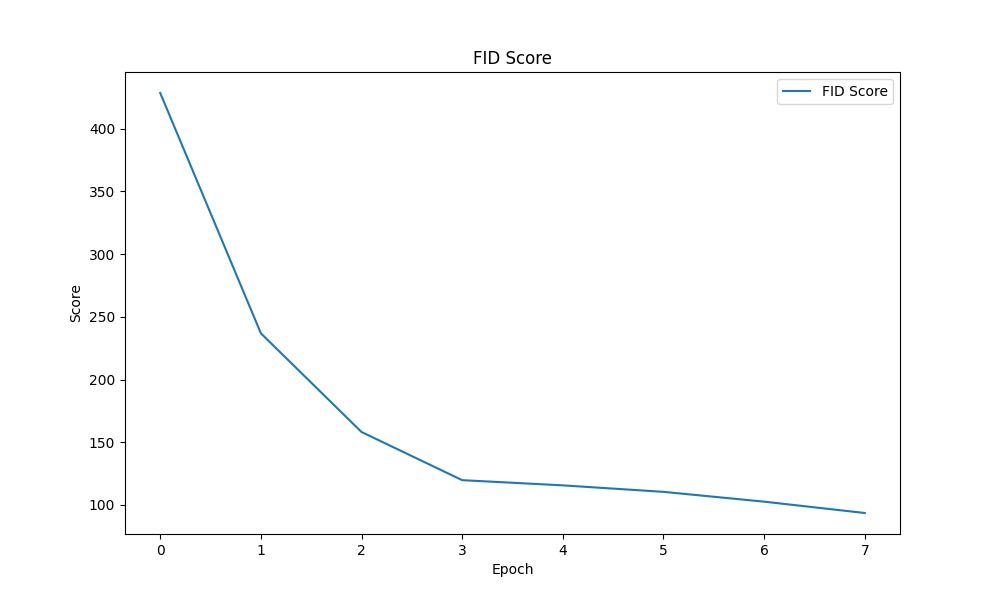

Images at Epoch 60:

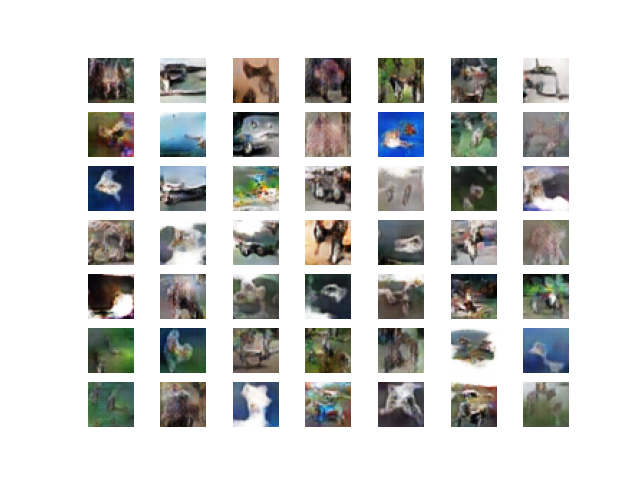

Images at Epoch 80:

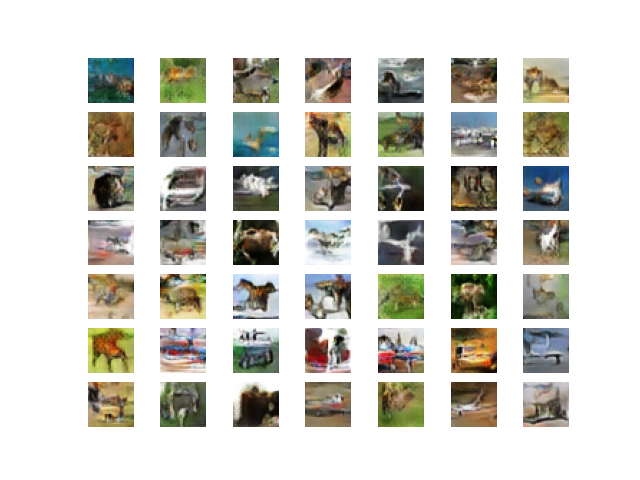
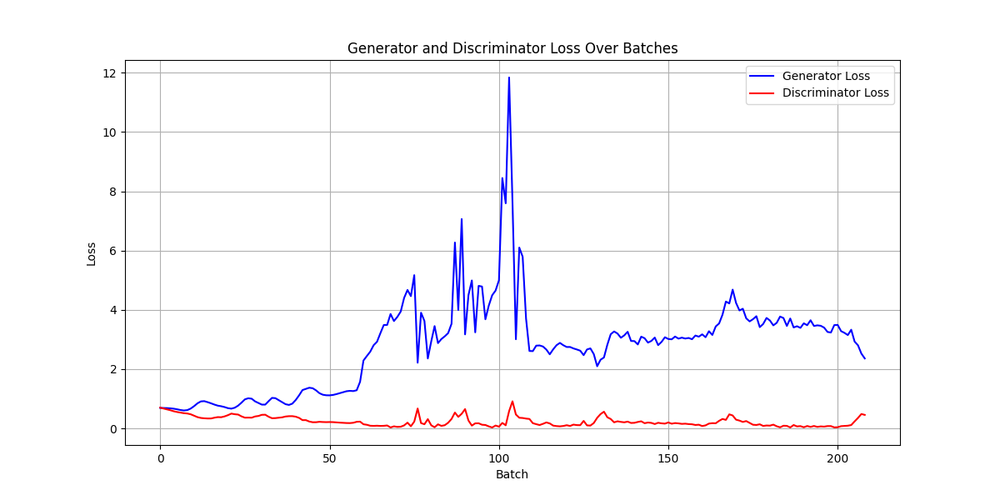

### Testing on one class

In [10]:
# load and prepare cifar10 training images
def load_real_samples():
    (X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
    X_train = X_train[y_train.squeeze() == 8] 
    X = (X_train / 127.5) - 1.0
    return X

# select real samples
def generate_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples) # generate random integers
    X = dataset[ix] # retrieve selected images
    y = ones((n_samples, 1)) # generate 'real' class labels (1)
    return X, y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples) # generate points in the latent space
    x_input = x_input.reshape(n_samples, latent_dim) # reshape into a batch of inputs for the network
    return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples) # generate points in latent space
    X = g_model.predict(x_input)
    y = zeros((n_samples, 1)) # create 'fake' class labels (0)
    return X, y
    
# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1) / 2.0
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])
    # specify the directory name
    directory = 'DCGAN bird Images'
    # create directory if it doesn't exist
    if not os.path.exists(directory):
        os.makedirs(directory)
    # save plot to file within the directory
    filename = f'{directory}/generated_plot_DCGAN_birds_e{epoch+1:03d}.png'
    plt.savefig(filename)
    plt.close()  # Close the plot to avoid displaying it in a notebook environment

# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=1000):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real * 100, acc_fake * 100))

    # Calculate and display discriminator loss and accuracy
    d_loss_real = d_model.evaluate(X_real, y_real, verbose=0)
    d_loss_fake = d_model.evaluate(x_fake, y_fake, verbose=0)

    print(f"Discriminator Loss Real: {d_loss_real[0]}, Accuracy Real: {d_loss_real[1]*100:.2f}%")
    print(f"Discriminator Loss Fake: {d_loss_fake[0]}, Accuracy Fake: {d_loss_fake[1]*100:.2f}%")

    # Save generated images into a file
    save_plot(x_fake, epoch)  



def plot_loss(generator_losses, discriminator_losses, save_path=None):
    plt.figure(figsize=(12, 6))
    plt.plot(generator_losses, label='Generator Loss', color='blue')
    plt.plot(discriminator_losses, label='Discriminator Loss', color='red')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Generator and Discriminator Loss Over Batches')
    plt.grid(True)
    
    if save_path:
        plt.savefig(save_path)  # Save the plot to a file
        
    plt.close()

# defining the discriminator model
def define_discriminator(in_shape=(32, 32, 3)):
    model = Sequential()
    # normal
    model.add(Conv2D(64, (3, 3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0001, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    return model

# define the generator model
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 4x4 image
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))
    # upsample to 8x8
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 16x16
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer
    model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# Load the InceptionV3 model pre-trained on ImageNet
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Create a function to preprocess images for InceptionV3
def preprocess_images(images):
    # Resize images to the size expected by InceptionV3
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess the images for InceptionV3
    return preprocess_input(images_resized * 255)

# Before training loop
generator_losses = []
discriminator_losses = []
fid_score_list = []

def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=128, fid_calculation_interval=10, fid_threshold=None, plot_interval=10):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)

            # Inside the training loop
            generator_losses.append(g_loss)
            discriminator_losses.append((d_loss1 + d_loss2) / 2)  # Average of real and fake discriminator losses
            
            # summarize loss on this batch
            if j % 100 == 0:
                epoch_num = i + 1
                batch_num = j + 1

                
                print(
                    f'Epoch {epoch_num}, Batch {batch_num}/{bat_per_epo} | '
                    f'Discriminator Loss (Real): {d_loss1:.3f} | '
                    f'Discriminator Loss (Fake): {d_loss2:.3f} | '
                    f'Generator Loss: {g_loss:.3f}'
                )

        # Plot loss at specified intervals
        if i % 10 == 0:
            plot_loss(generator_losses, discriminator_losses, save_path='DCGAN birds Loss.png')
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, 1000)
            X_real, y_real = generate_real_samples(dataset, 1000)
            fid_score = calculate_fid(inception_model, X_real, X_fake)
            fid_score_list.append(fid_score)
            plot_fid_score(fid_score_list, save_path='FID DCGAN birds Score.png')
                
        # evaluate the model performance, sometimes
        if (i+1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)


# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=80, n_batch=256, fid_calculation_interval=10, fid_threshold=75.0, plot_interval=2)

4/4 [==============================] - 0s 3ms/step
Epoch 1, Batch 1/19 | Discriminator Loss (Real): 0.706 | Discriminator Loss (Fake): 0.695 | Generator Loss: 0.692
4/4 [==============================] - 0s 3ms/step
Epoch 2, Batch 1/19 | Discriminator Loss (Real): 0.109 | Discriminator Loss (Fake): 0.753 | Generator Loss: 0.762
4/4 [==============================] - 0s 3ms/step
Epoch 3, Batch 1/19 | Discriminator Loss (Real): 0.014 | Discriminator Loss (Fake): 0.338 | Generator Loss: 1.360
4/4 [==============================] - 0s 3ms/step
Epoch 4, Batch 1/19 | Discriminator Loss (Real): 0.342 | Discriminator Loss (Fake): 0.002 | Generator Loss: 6.400
4/4 [==============================] - 0s 3ms/step
Epoch 5, Batch 1/19 | Discriminator Loss (Real): 0.682 | Discriminator Loss (Fake): 0.292 | Generator Loss: 3.154
4/4 [==============================] - 0s 3ms/step
Epoch 6, Batch 1/19 | Discriminator Loss (Real): 0.326 | Discriminator Loss (Fake): 0.100 | Generator Loss: 3.518
4/4 [=====

### Results:

Birds Loss:

![DCGAN birds Loss.png](<attachment:DCGAN birds Loss.png>)

FID Score:

![FID DCGAN birds Score.png](<attachment:FID DCGAN birds Score.png>)

Images at epoch 60:

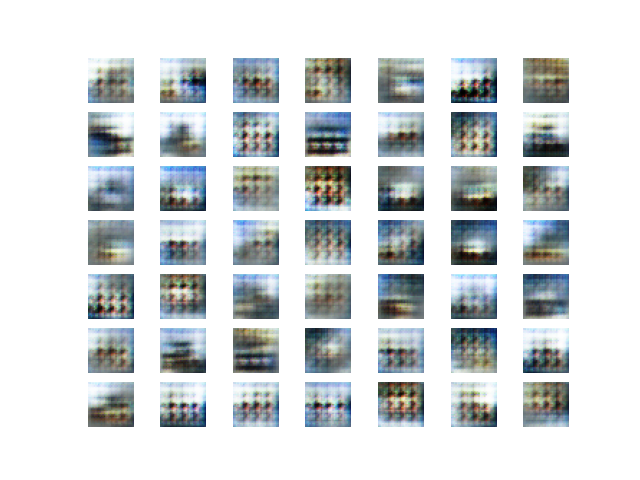

Images at epoch 80:

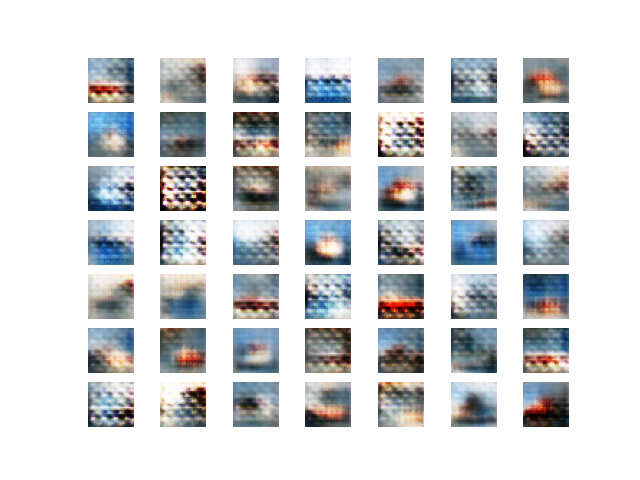
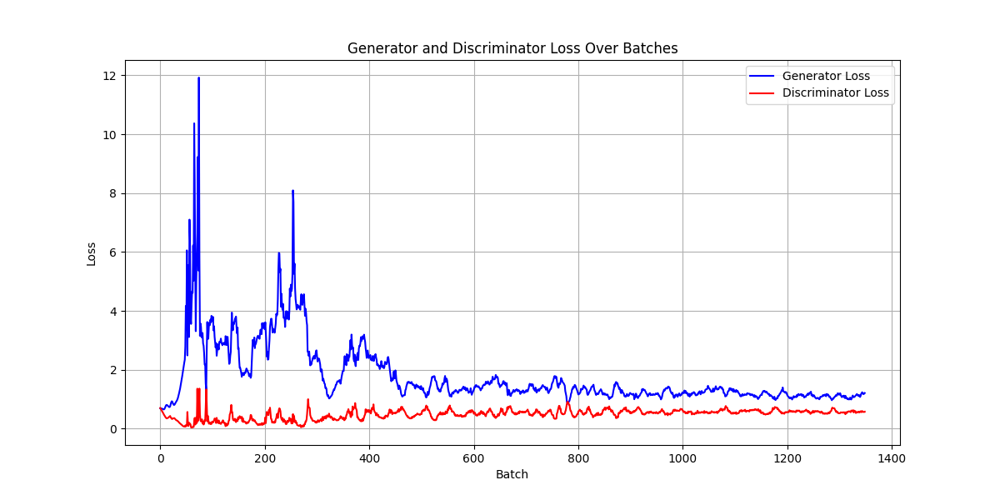
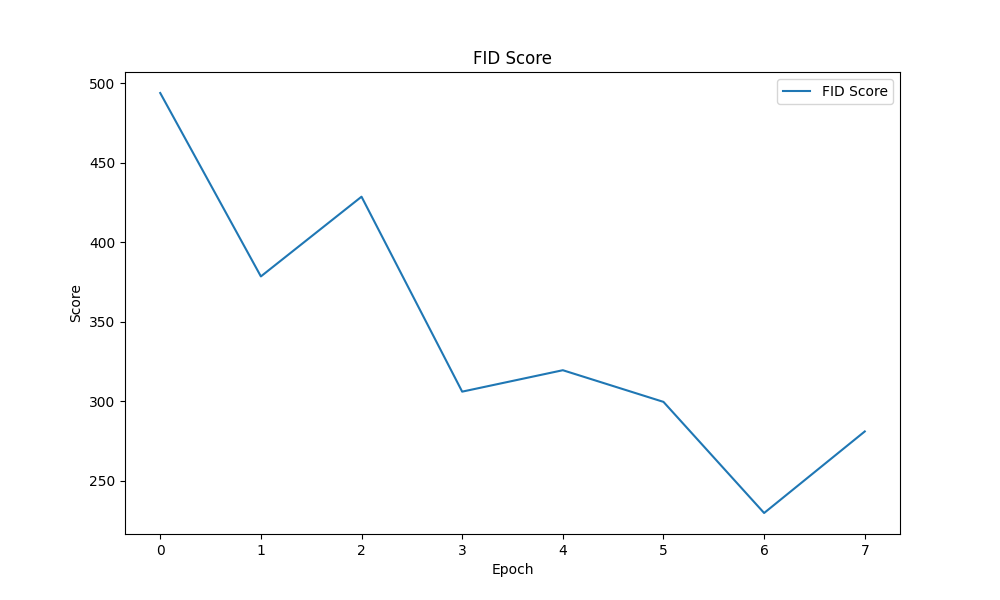

### Model Improvement

We see that we managed to generate somewhat coherent images from running 80 epochs. Our aim now is to improve the generated images to have a clearer generated image, and also reduce the number of epochs needed to generate quality images. Here are some techniques we will implement to improve the model: 

#### Changing the optimizer: using RMSProp Optimizer instead of Adam.

#### Image Augmentation: changing training images to give model

### Why Image Augmentation?


One of the main challenges in deep learning is collecting enough data to train a model effectively. Image augmentation allows us to artificially create new training examples from the cifar10 dataset by applying random transformations such as flips, rotations, cropping, brightness adjustments, and color jittering. This helps to mitigate overfitting and improve the generalizability of your model, meaning it will perform better on unseen data.

### Why RMSProp Optimizer?

- More stable convergence: 

RMSprop can provide more stable convergence compared to Adam, especially in later stages of training.

- Better for sparse data: 

RMSprop can be more effective for tasks with sparse gradients compared to Adam.

- Can be less computationally expensive: 

RMSprop can sometimes be slightly faster than Adam in terms of computation time.





In [ ]:
def find_class_distribution(labels):
    counter = Counter(labels)
    return counter


def augment_images(X_train, y_train_labels, batch_size, target_count):
    # Find out the current distribution of classes
    distribution = find_class_distribution(y_train_labels)
    print("Current distribution:", distribution)


    # Create an instance of the ImageDataGenerator with brightness range
    data_gen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2]
    )


    # Augment classes with fewer images than the target_count
    for class_label, count in distribution.items():
        if count < target_count:
            # How many additional images do we want
            additional_images_needed = target_count - count


            # Get the indices of all occurrences of this class
            class_indices = [i for i, label in enumerate(y_train_labels) if label == class_label]


            # Augment images until we reach the target count
            while additional_images_needed > 0:
                # Get a batch of images from this class
                batch_indices = np.random.choice(class_indices, size=min(batch_size, additional_images_needed))
                batch_images = X_train[batch_indices]


                # Add batch dimension for data_gen.flow()
                batch_images = np.expand_dims(batch_images, axis=-1)  # Add the channel dimension


                # Generate augmented images
                augmented_images = next(data_gen.flow(batch_images, batch_size=batch_size))
               
                # Remove the color channel dimension for grayscale
                augmented_images = np.squeeze(augmented_images, axis=-1)
               
                # Append augmented images and labels to the training set
                X_train = np.concatenate((X_train, augmented_images))
                y_train_labels.extend([class_label] * augmented_images.shape[0])


                # Update the number of additional images needed
                additional_images_needed -= augmented_images.shape[0]


    # After augmentation, reshape X_train if needed to ensure it's in the correct shape
    X_train = X_train.reshape((-1, 128, 128, 1))
   
    return X_train, y_train_labels




# load and prepare cifar10 training images
def load_real_samples():
    (X_train, labels), (_, _) = cifar10.load_data()
    X = X_train.astype('float32')
    X = (X - 127.5) / 127.5 # scale from [0,255] to [-1,1]
    return X


# select real samples
def generate_real_samples(dataset, n_samples, augmentation_function=None):
    # Get randomly selected 'real' samples
    ix = randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
   
    # Augment real samples if augmentation function is provided
    if augmentation_function:
        if len(X.shape) == 3:  # For grayscale images
            X = np.expand_dims(X, axis=-1)  # Add the channel dimension


        X = augmentation_function.flow(X, batch_size=n_samples, shuffle=False).next()


        if len(X.shape) == 4 and X.shape[-1] == 1:  # Remove the color channel dimension for grayscale
            X = np.squeeze(X, axis=-1)


    y = ones((n_samples, 1))  # generate 'real' class labels (1)
    return X, y






# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples) # generate points in the latent space
    x_input = x_input.reshape(n_samples, latent_dim) # reshape into a batch of inputs for the network
    return x_input


# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples) # generate points in latent space
    X = g_model.predict(x_input)
    y = zeros((n_samples, 1)) # create 'fake' class labels (0)
    return X, y
   
# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1) / 2.0
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])
    # specify the directory name
    directory = 'DCGAN Improved Images'
    # create directory if it doesn't exist
    if not os.path.exists(directory):
        os.makedirs(directory)
    # save plot to file within the directory
    filename = f'{directory}/generated_plot_DCGAN_Improved_e{epoch+1:03d}.png'
    plt.savefig(filename)
    plt.close()  # Close the plot to avoid displaying it in a notebook environment


# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=1000):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real * 100, acc_fake * 100))


    # Calculate and display discriminator loss and accuracy
    d_loss_real = d_model.evaluate(X_real, y_real, verbose=0)
    d_loss_fake = d_model.evaluate(x_fake, y_fake, verbose=0)


    print(f"Discriminator Loss Real: {d_loss_real[0]}, Accuracy Real: {d_loss_real[1]*100:.2f}%")
    print(f"Discriminator Loss Fake: {d_loss_fake[0]}, Accuracy Fake: {d_loss_fake[1]*100:.2f}%")


    # Save generated images into a file
    save_plot(x_fake, epoch)  






def plot_loss(generator_losses, discriminator_losses, save_path=None):
    plt.figure(figsize=(12, 6))
    plt.plot(generator_losses, label='Generator Loss', color='blue')
    plt.plot(discriminator_losses, label='Discriminator Loss', color='red')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Generator and Discriminator Loss Over Batches')
    plt.grid(True)
   
    if save_path:
        plt.savefig(save_path)  # Save the plot to a file 
       
    plt.close()




def define_discriminator(in_shape=(32, 32, 3)):
    model = Sequential()
    # normal
    model.add(Conv2D(64, (3, 3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt =  RMSprop(learning_rate=0.0001)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
   
    # # Feature matching
    # if return_intermediate:
    #     # Assuming you want to use features from the second last layer for feature matching
    #     intermediate_layer_model = Model(inputs=model.input, outputs=model.layers[-2].output)
    #     return intermediate_layer_model
    # else:
    return model


# define the standalone generator model
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 4x4 image
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))
    # upsample to 8x8
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 16x16
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer
    model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
    return model




# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt =  RMSprop(learning_rate=0.0001)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model


# Load the InceptionV3 model pre-trained on ImageNet
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))


# Create a function to preprocess images for InceptionV3
def preprocess_images(images):
    # Resize images to the size expected by InceptionV3
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess the images for InceptionV3
    return preprocess_input(images_resized * 255)


# Before training loop
generator_losses = []
discriminator_losses = []
fid_score_list = []


def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=128, fid_calculation_interval=10, fid_threshold=None, plot_interval=10):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
   
    # Create an instance of the ImageDataGenerator for augmentation during training
    augmentation_function = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2]
    )


    # Before the training loop
    generator_losses = []
    discriminator_losses = []
    fid_score_list = []


    # Manually enumerate epochs
    for i in range(n_epochs):
        # Enumerate batches over the training set
        for j in range(bat_per_epo):
            # Get randomly selected 'real' samples with augmentation
            X_real, y_real = generate_real_samples(dataset, half_batch, augmentation_function)
            # Update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # Generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # Update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # Prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # Create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # Update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)


            # Inside the training loop
            generator_losses.append(g_loss)
            discriminator_losses.append((d_loss1 + d_loss2) / 2)  # Average of real and fake discriminator losses


            # Summarize loss on this batch
            if j % 100 == 0:
                epoch_num = i + 1
                batch_num = j + 1


                print(
                    f'Epoch {epoch_num}, Batch {batch_num}/{bat_per_epo} | '
                    f'Discriminator Loss (Real): {d_loss1:.3f} | '
                    f'Discriminator Loss (Fake): {d_loss2:.3f} | '
                    f'Generator Loss: {g_loss:.3f}'
                )


        # Plot loss at specified intervals
        if i % 10 == 0:
            plot_loss(generator_losses, discriminator_losses, save_path='DCGAN Improved Loss.png')
            fid_score = calculate_fid(inception_model, X_real, X_fake)
            fid_score_list.append(fid_score)
            plot_fid_score(fid_score_list, save_path='FID DCGAN Improved Score.png')


        # Evaluate the model performance, sometimes
        if (i + 1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)



# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=80, n_batch=256, fid_calculation_interval=10, fid_threshold=75.0, plot_interval=2)

### Results:

DCGAN Improved Loss:

![DCGAN Improved Loss.png](<attachment:DCGAN Improved Loss.png>)

DCGAN Improved FID:

![FID DCGAN Improved Score.png](<attachment:FID DCGAN Improved Score.png>)

DCGAN Improved Epoch 60

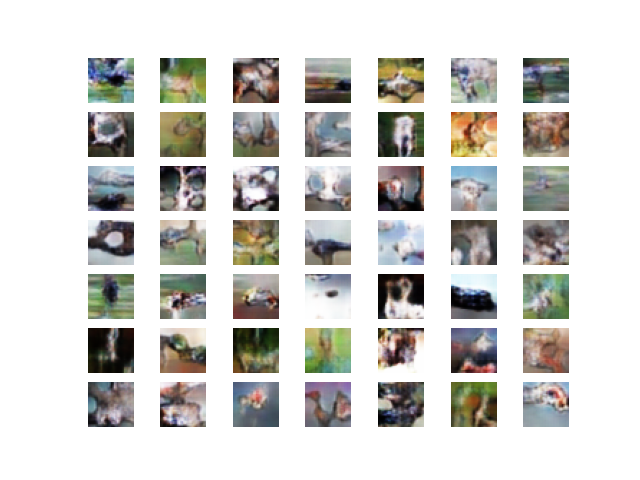

DCGAN Improved Epoch 80

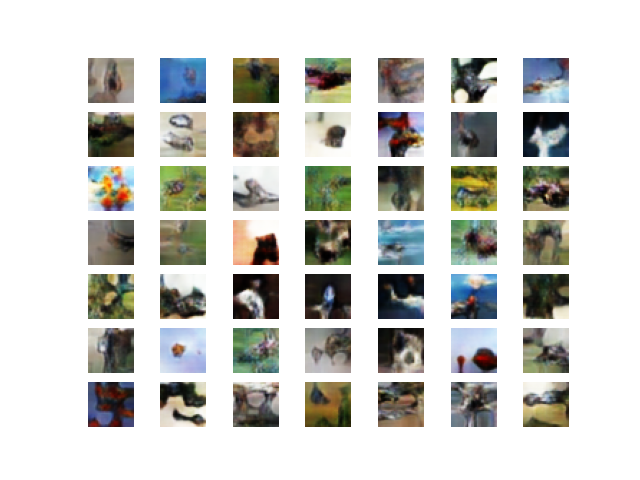
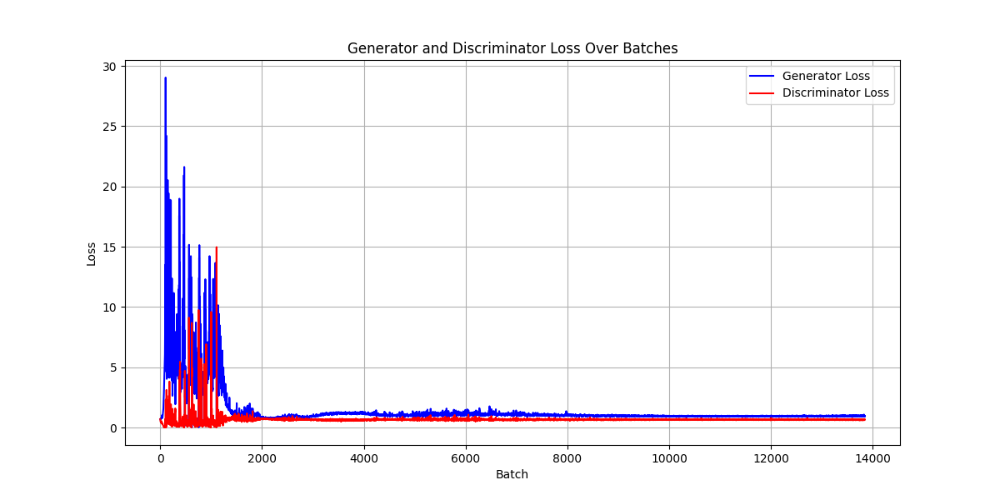
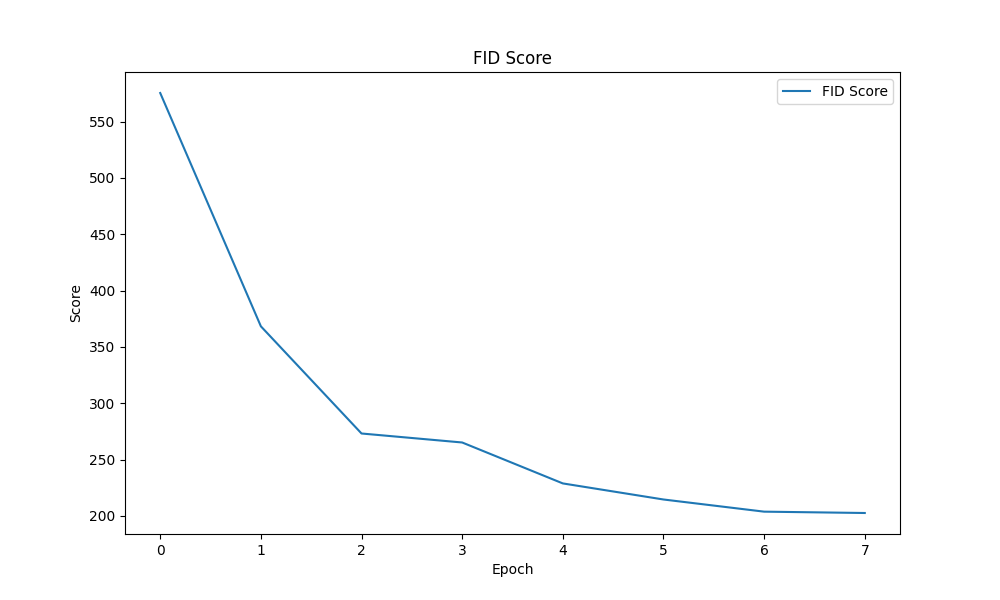

In [ ]:
# Set the directory where you want to save the models.
model_save_dir = 'E:'  # Change this to your preferred directory.

# Create the directory if it doesn't exist
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

# Save the weights of the generator and discriminator.
g_model.save_weights(os.path.join(model_save_dir, 'DCGAN_improved_generator_weights.h5'))
d_model.save_weights(os.path.join(model_save_dir, 'DCGAN_improved_discriminator_weights.h5'))
print("Model weights saved.")

# If you want to save the entire model (architecture + weights + optimizer state)
g_model.save(os.path.join(model_save_dir, 'DCGAN_improved_generator_model.h5'))
d_model.save(os.path.join(model_save_dir, 'DCGAN_improved_discriminator_model.h5'))
print("Full models saved.")


## Testing Model

Loading weights of DCGAN model and testing model by generating 30 images

1/1 [==============================] - 0s 103ms/step


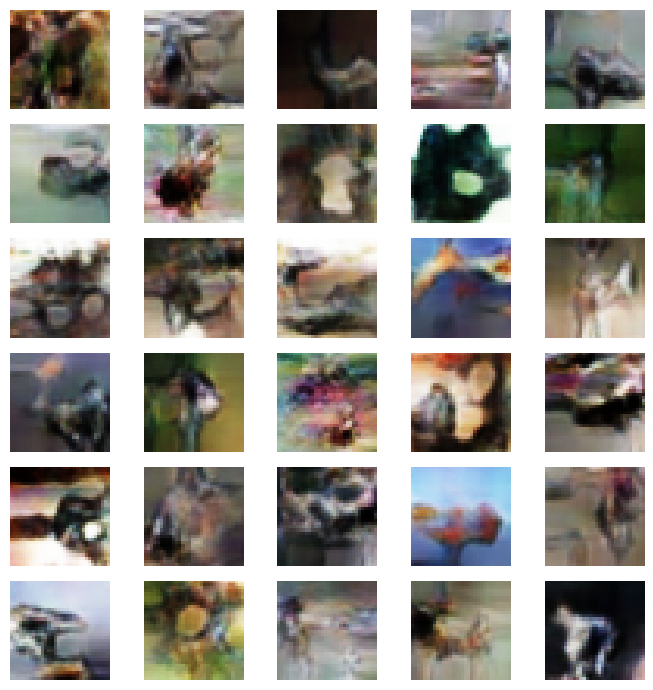

In [30]:
# Set the directory where you saved the models.
model_save_dir = 'E:'  # Change this to the directory where you saved the generator model.

# Load the saved generator model
g_model = load_model(os.path.join(model_save_dir, 'DCGAN_improved_generator_model.h5'))

# Generate points in the latent space
latent_dim = 100  # Replace with the latent dimension size used during training
n_samples = 30    # Generate 30 images
x_input = np.random.randn(latent_dim * n_samples)  # Random points in the latent space
x_input = x_input.reshape(n_samples, latent_dim)   # Reshape into a batch of inputs for the network

# Use the generator model to make predictions (generate images)
generated_images = g_model.predict(x_input)

# Post-process the images
generated_images = (generated_images + 1) / 2.0  # Scale from [-1,1] to [0,1]

# Plot the generated images
plt.figure(figsize=(7, 7))  # Adjust the size of the figure as needed
for i in range(n_samples):
    # define subplot
    plt.subplot(6, 5, i + 1)  # 6 rows, 5 columns
    # turn off axis
    plt.axis('off')
    # plot raw pixel data
    plt.imshow(generated_images[i])
plt.tight_layout()  # This will ensure the subplots are nicely fit in the figure
plt.show()


#### Saving generated images

In [14]:
# Plot the generated images
for i in range(n_samples):
    # scale from [-1,1] to [0,1]
    image = (generated_images[i, :, :, :] + 1) / 2.0
    plt.imshow(image)
    plt.axis('off')
    filename = f'E:/DCGAN_generated_image_{i+1:02d}.png'
    plt.savefig(filename)
    plt.close()
print('Generated images saved to disk.')


Generated images saved to disk.


##### 

### Exploring other GAN Architectures for the CIFAR10 dataset.

### 1. Conditional GANs

In a situation where we want a GAN to generate a specific type of data, but did not have sufficient control over our GAN outputs, we turn to conditional GANs to fix this issue.

Conditional GAN (cGAN) allows us to condition the network with additional information such as class labels. It means that during the training, we pass images to the network with their actual labels (rose, tulip, sunflower etc.) for it to learn the difference between them. That way, we gain the ability to ask our model to generate images of specific flowers.

Key Differences

- The difference in code between this CGAN and our DCGAN is the usage of the labels. The generator in this CGAN takes two inputs: noise and class labels. The class labels are embedded into a dense representation, which is then combined with the noise vector. This combination guides the generator to produce images conditioned on the specific class labels.

- Similarly, the discriminator in cGAN takes two inputs: images and class labels. The images (real or generated) are concatenated with a representation of the class labels. This allows the discriminator to judge the authenticity of images in the context of specific class labels.

- We also have several architecture adjustments where there are additional layers (like Embedding, Flatten, Multiply, and Concatenate) to handle the class label inputs in both the generator and discriminator. These layers help in embedding the labels and integrating them with the main model architecture.

cGAN: Conditional Generative Adversarial Network — How to Gain Control Over GAN Outputs: https://towardsdatascience.com/cgan-conditional-generative-adversarial-network-how-to-gain-control-over-gan-outputs-b30620bd0cc8

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import cifar10
from keras.models import Model, Sequential
from keras.layers import Input, Dense, Reshape, Conv2D, Conv2DTranspose, Flatten, Embedding, multiply, LeakyReLU, Dropout, Activation, BatchNormalization
from keras.optimizers import Adam
from numpy.random import randint, randn
from numpy import ones, zeros

# Load and prepare CIFAR10 training images
def load_cifar10_data():
    (X_train, y_train), (_, _) = cifar10.load_data()
    X_train = X_train.astype('float32')
    X_train = (X_train - 127.5) / 127.5  # Scale from [0,255] to [-1,1]
    return X_train, y_train

def plot_loss(generator_losses, discriminator_losses, save_path=None):
    plt.figure(figsize=(12, 6))
    plt.plot(generator_losses, label='Generator Loss', color='blue')
    plt.plot(discriminator_losses, label='Discriminator Loss', color='red')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Generator and Discriminator Loss Over Batches')
    plt.grid(True)
    
    if save_path:
        plt.savefig(save_path)  # Save the plot to a file
        
    plt.close()

def calculate_fid(inception_model, images1, images2):
    # Preprocess the images for InceptionV3
    images1 = np.array([resize(img, (299, 299, 3)) for img in images1])
    images2 = np.array([resize(img, (299, 299, 3)) for img in images2])

    # Generate InceptionV3 embeddings for the images
    embeddings1 = inception_model.predict(images1)
    embeddings2 = inception_model.predict(images2)

    # Calculate FID score
    fid = calculate_fid_score(embeddings1, embeddings2)

    return fid

def calculate_fid_score(features1, features2):
    mu1, sigma1 = features1.mean(axis=0), np.cov(features1, rowvar=False)
    mu2, sigma2 = features2.mean(axis=0), np.cov(features2, rowvar=False)

    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

    return fid
    
def plot_fid_score(fid_scores, save_path=None):

        plt.figure(figsize=(10, 6))
        plt.plot(fid_scores, label='FID Score')
        plt.xlabel('Epoch')
        plt.ylabel('Score')
        plt.title('FID Score')
        plt.legend()
        if save_path:
            plt.savefig(save_path)  # Save the plot to a file
        plt.close()

# Generate real samples
def get_real_samples(dataset, labels, n_samples):
    idx = randint(0, dataset.shape[0], n_samples)
    X, labels = dataset[idx], labels[idx]
    y = ones((n_samples, 1))
    return X, labels, y

# Generate latent points
def generate_latent_points(latent_dim, n_samples, n_classes=10):
    z = randn(latent_dim * n_samples)
    z = z.reshape(n_samples, latent_dim)
    labels = randint(0, n_classes, n_samples).reshape(-1, 1)
    return z, labels

# Generate fake samples
def create_fake_samples(generator, latent_dim, n_samples):
    z, labels = generate_latent_points(latent_dim, n_samples)
    images = generator.predict([z, labels])
    y = zeros((n_samples, 1))
    return images, labels, y

# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1) / 2.0
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])
    # specify the directory name
    directory = 'CGAN Images'
    # create directory if it doesn't exist
    if not os.path.exists(directory):
        os.makedirs(directory)
    # save plot to file within the directory
    filename = f'{directory}/generated_plot_CGAN_Images_e{epoch+1:03d}.png'
    plt.savefig(filename)
    plt.close()  # Close the plot to avoid displaying it in a notebook environment


# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, generator, d_model, dataset, latent_dim, n_samples=1000):
    # Prepare real samples
    X_real, labels_real, y_real = get_real_samples(dataset, labels, n_samples)
    # Evaluate discriminator on real examples
    _, acc_real = d_model.evaluate([X_real, labels_real], y_real, verbose=0)  # Adjusted to pass both inputs
    # Prepare fake examples
    X_fake, labels_fake, y_fake = create_fake_samples(generator, latent_dim, n_samples)
    # Evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate([X_fake, labels_fake], y_fake, verbose=0)  # Adjusted to pass both inputs
    # Summarize discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real * 100, acc_fake * 100))

    # Calculate and display discriminator loss and accuracy
    d_loss_real = d_model.evaluate([X_real, labels_real], y_real, verbose=0)
    d_loss_fake = d_model.evaluate([X_fake, labels_fake], y_fake, verbose=0)

    print(f"Discriminator Loss Real: {d_loss_real[0]}, Accuracy Real: {d_loss_real[1]*100:.2f}%")
    print(f"Discriminator Loss Fake: {d_loss_fake[0]}, Accuracy Fake: {d_loss_fake[1]*100:.2f}%")

    # Save generated images into a file
    save_plot(X_fake, epoch)


# Define the generator model
def build_generator(latent_dim):
    noise = Input(shape=(latent_dim,))
    label = Input(shape=(1,))
    label_embedding = Flatten()(Embedding(10, latent_dim)(label))
    model_input = multiply([noise, label_embedding])
    
    x = Dense(256 * 4 * 4)(model_input)  # Remove the activation here
    x = LeakyReLU(alpha=0.2)(x)  
    x = Reshape((4, 4, 256))(x)
    x = Conv2DTranspose(128, kernel_size=4, strides=2, padding="same")(x)  # Remove the activation here
    x = LeakyReLU(alpha=0.2)(x)  # Add LeakyReLU with a custom alpha
    x = Conv2DTranspose(64, kernel_size=4, strides=2, padding="same")(x)  # Remove the activation here
    x = LeakyReLU(alpha=0.2)(x)  # Add LeakyReLU with a custom alpha
    x = Conv2DTranspose(3, kernel_size=4, strides=2, padding="same", activation="tanh")(x)
    
    model = Model([noise, label], x)
    return model


# Define the discriminator model
def build_discriminator():
    img = Input(shape=(32, 32, 3))
    label = Input(shape=(1,))
    label_embedding = Flatten()(Embedding(10, np.prod((32, 32, 3)))(label))
    label_embedding = Reshape((32, 32, 3))(label_embedding)
    
    merged_input = multiply([img, label_embedding])
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same", activation=LeakyReLU(alpha=0.2))(merged_input)
    x = LeakyReLU(alpha=0.2)(x)  
    x = Conv2D(128, kernel_size=3, strides=2, padding="same", activation=LeakyReLU(alpha=0.2))(x)
    x = LeakyReLU(alpha=0.2)(x)  
    x = Conv2D(256, kernel_size=3, strides=2, padding="same", activation=LeakyReLU(alpha=0.2))(x)
    x = LeakyReLU(alpha=0.2)(x)  
    x = Flatten()(x)
    x = Dense(1, activation="sigmoid")(x)
    
    model = Model([img, label], x)
    opt = Adam(lr=0.001, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])
    return model

# Combine generator and discriminator into GAN model
def define_gan(generator, discriminator):
    # Make sure the discriminator's parameters are not trainable in the GAN model
    discriminator.trainable = False
    
    # Generator model input (noise and label)
    gen_noise = Input(shape=(latent_dim,))
    gen_label = Input(shape=(1,))
    
    # Generated image by the generator model
    gen_image = generator([gen_noise, gen_label])
    
    # Discriminator model output (validity of the generated image)
    gan_output = discriminator([gen_image, gen_label])
    
    # GAN model definition
    model = Model([gen_noise, gen_label], gan_output)
    opt = Adam(lr=0.001, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=opt)
    
    return model

# Load the InceptionV3 model pre-trained on ImageNet
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Create a function to preprocess images for InceptionV3
def preprocess_images(images):
    # Resize images to the size expected by InceptionV3
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess the images for InceptionV3
    return preprocess_input(images_resized * 255)

# Before training loop
generator_losses = []
discriminator_losses = []
fid_score_list = []

# Adapted training function
def train_gan(generator, discriminator, gan, dataset, labels, latent_dim, n_epochs=100, n_batch=128):
    # bat_per_epo = int(dataset.shape[0] / n_batch)
    bat_per_epo = 500
    half_batch = int(n_batch / 2)
    for i in range(n_epochs):
        for j in range(bat_per_epo):
            X_real, labels_real, y_real = get_real_samples(dataset, labels, half_batch)
            d_loss_real, _ = discriminator.train_on_batch([X_real, labels_real], y_real)
            X_fake, labels_fake, y_fake = create_fake_samples(generator, latent_dim, half_batch)
            d_loss_fake, _ = discriminator.train_on_batch([X_fake, labels_fake], y_fake)
            z_input, labels_input = generate_latent_points(latent_dim, n_batch)
            y_gan = ones((n_batch, 1))
            g_loss = gan.train_on_batch([z_input, labels_input], y_gan)
            print(f'Epoch {i+1}, {j+1}/{bat_per_epo}, d1={d_loss_real:.3f}, d2={d_loss_fake:.3f} g={g_loss:.3f}')
        
            # Inside the training loop
            generator_losses.append(g_loss)
            discriminator_losses.append((d_loss_real + d_loss_fake) / 2)
        
        # Plot loss at specified intervals
        if i % 10 == 0:
            plot_loss(generator_losses, discriminator_losses, save_path='CGAN Loss.png')
            X_fake, _, y_fake = create_fake_samples(generator, latent_dim, 1000)
            X_real, _, y_real = get_real_samples(dataset, labels, 1000)
            fid_score = calculate_fid(inception_model, X_real, X_fake)
            fid_score_list.append(fid_score)
            plot_fid_score(fid_score_list, save_path='FID CGAN Score.png')
        
        
        if (i+1) % 10 == 0:
            summarize_performance(i, generator, discriminator, dataset, latent_dim, n_samples=150)

# Load data
dataset, labels = load_cifar10_data()

# Define model elements
latent_dim = 100
generator = build_generator(latent_dim)
discriminator = build_discriminator()
gan = define_gan(generator, discriminator)

# Train the model
train_gan(generator, discriminator, gan, dataset, labels, latent_dim, n_epochs=100, n_batch=64)

1/1 [==============================] - 0s 96ms/step
Epoch 1, 1/500, d1=0.693, d2=0.704 g=0.691
1/1 [==============================] - 0s 19ms/step
Epoch 1, 2/500, d1=0.688, d2=0.697 g=0.692
1/1 [==============================] - 0s 18ms/step
Epoch 1, 3/500, d1=0.686, d2=0.699 g=0.692
1/1 [==============================] - 0s 23ms/step
Epoch 1, 4/500, d1=0.683, d2=0.700 g=0.692
1/1 [==============================] - 0s 19ms/step
Epoch 1, 5/500, d1=0.672, d2=0.705 g=0.692
1/1 [==============================] - 0s 24ms/step
Epoch 1, 6/500, d1=0.648, d2=0.712 g=0.693
1/1 [==============================] - 0s 19ms/step
Epoch 1, 7/500, d1=0.586, d2=0.732 g=0.694
1/1 [==============================] - 0s 19ms/step
Epoch 1, 8/500, d1=0.516, d2=0.699 g=0.695
1/1 [==============================] - 0s 19ms/step
Epoch 1, 9/500, d1=0.274, d2=1.012 g=0.699
1/1 [==============================] - 0s 22ms/step
Epoch 1, 10/500, d1=0.167, d2=0.686 g=0.709
1/1 [==============================] - 0s 21ms/st

KeyboardInterrupt: 

: 

### Results:

CGAN Loss:

![CGAN Loss.png](<attachment:CGAN Loss.png>)

CGAN FID Score:

![FID CGAN Score.png](<attachment:FID CGAN Score.png>)

CGAN Images at epoch 60:

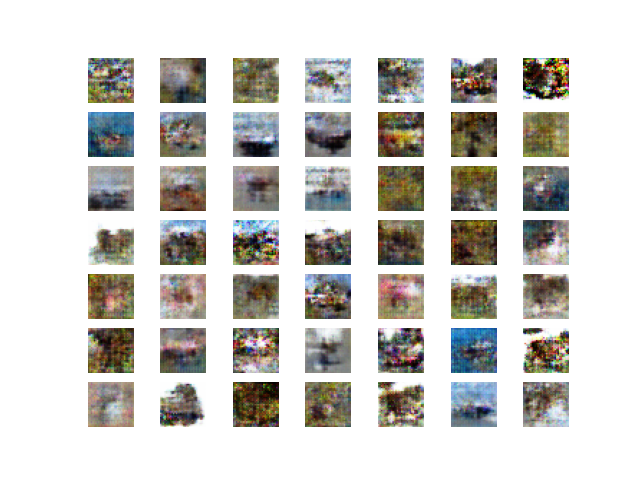

CGAN Images at epoch 80:

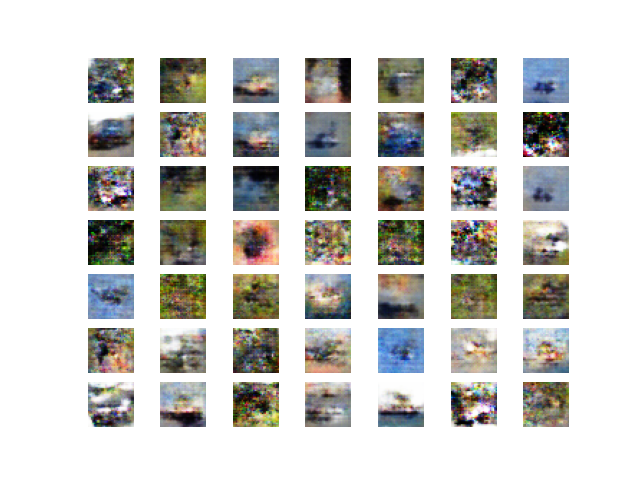
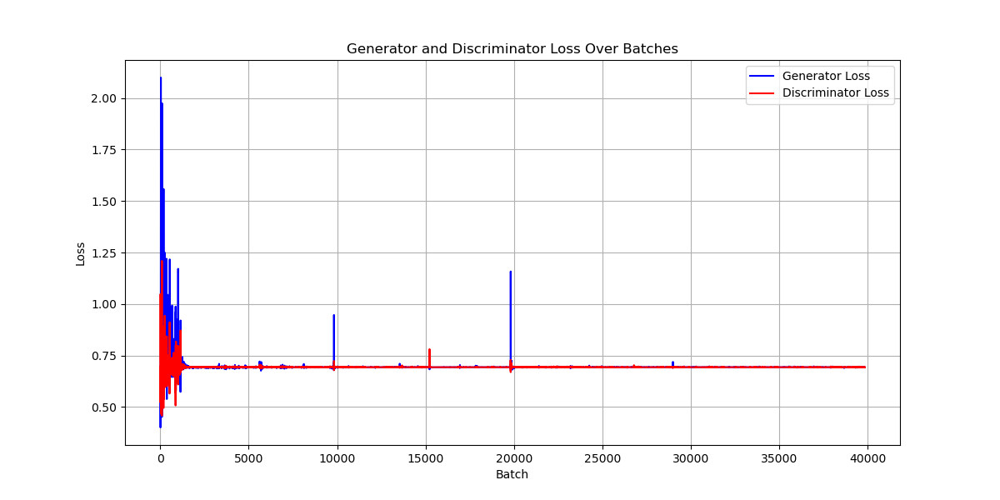
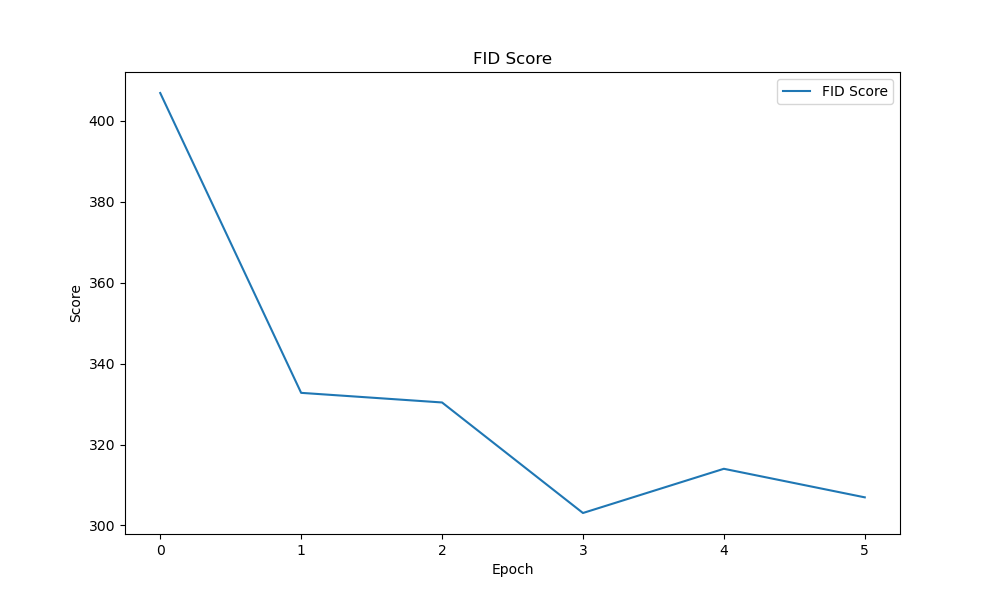

### Diffusion Model (Simple Diffusion Model using CNN)


References: 

- [Introduction to diffusion models for machine learning](https://www.superannotate.com/blog/diffusion-models#:~:text=In%20the%20context%20of%20machine,distribution%20from%20the%20noisy%20data.)
- [A very short introduction to diffusion models](https://kailashahirwar.medium.com/a-very-short-introduction-to-diffusion-models-a84235e4e9ae)
- [Diffusion Model Clearly Explained!](https://medium.com/@steinsfu/diffusion-model-clearly-explained-cd331bd41166)
- [Diffusion Models Made Easy](https://towardsdatascience.com/diffusion-models-made-easy-8414298ce4da)

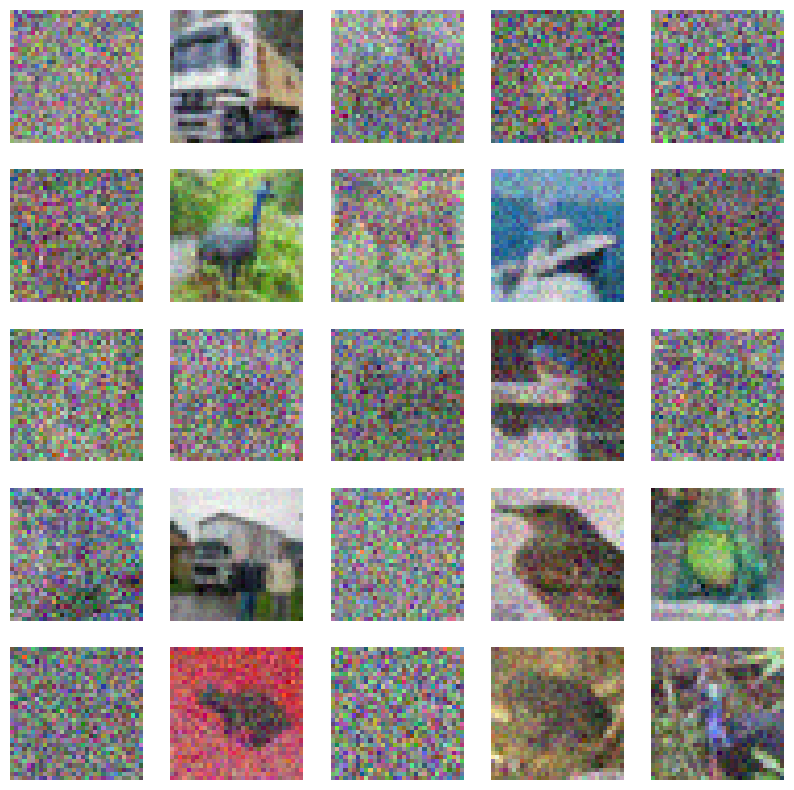

In [49]:
'''
Load the data from CIFAR10, normalise the images
'''
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
# X_train = X_train[y_train.squeeze() == 8] # We will be doing a stable diffusion on birds first
X_train = (X_train / 127.5) - 1.0

IMG_SIZE = 32     # input image size, CIFAR-10 is 32x32
BATCH_SIZE = 64  # for training batch size
timesteps = 32    # how many steps for a noisy image into clear
time_bar = 1 - np.linspace(0, 1.0, timesteps + 1) # linspace for timesteps


'''
Utility functions for displaying images:
- convert_image converts the images to a 0-1 range for display by normalizing the image's min and max values
- show_images displays a grid of images.
'''
def convert_image(img):
    img = img - img.min()
    img = (img / img.max())
    return img.astype(np.float32)

def show_images(x):
    plt.figure(figsize=(10, 10))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        img = convert_image(x[i])
        plt.imshow(img)
        plt.axis('off')

show_images(X_train)

'''
Applies noise to the images based on a specific timestep t. 
This simulates the forward process in a diffusion model, gradually adding noise to the images.
'''
def forward_noise(x, t):
    '''
    'x' is a batch of clean images, 't' is the timestep indiating how much noise to add to the image
    'a' and 'b' represents the noise levels at timesteps 't' and 't+1' which is fetched from a predefined 'time_bar' array.
    'time_bar' is a linearly spaced array decreasing from 1 to 0, where each value corresponds to a specific level of noise to be added
    '''
    a = time_bar[t]      # base on t
    b = time_bar[t + 1]  # image for t + 1
    
    # Generates a noise mask with the same shape as the input images
    noise = np.random.normal(size=x.shape)  # noise mask
    '''
    Calculates 'img_a' and 'img_b' by linearly interpolating between the clean image and the noise based on the noise levels specified
    in 'a' and 'b'. Essentially adding a proportion of noise to the clean image, where the proportion is determined by the timestep.
    '''
    a = a.reshape((-1, 1, 1, 1))
    b = b.reshape((-1, 1, 1, 1))
    img_a = x * (1 - a) + noise * a
    img_b = x * (1 - b) + noise * b

    '''
    Returns 2 versions of noisy images, 'img_a' and 'img_b' corresponding to the noise levels at timestep 't' and 't+1'
    '''
    return img_a, img_b


'''
Generates a batch of timesteps for training, which are used to determine the level of noise to be added to the original images.
'num' is the number of timesteps to generate
The function randomly selects 'num' integers within the range of timesteps, in this case 25
''' 
def generate_ts(num):
    return np.random.randint(0, timesteps, size=num)

# t = np.full((25,), timesteps - 1) # if you want see clarity
# t = np.full((25,), 0)             # if you want see noisy
t = generate_ts(25)             # random for training data
a, b = forward_noise(X_train[:25], t)

# Showing the noisy images to understand how the level of noise varies with different timesteps
show_images(a)

### U-Net Model for diffusion process

The stable diffusion process shrinks the image, and then expands it. Here is the U-Net image to visualise the process:

![U-Net](https://miro.medium.com/v2/resize:fit:1400/1*f7YOaE4TWubwaFF7Z1fzNw.png)

In [50]:

'''
Applies a series of convolutional transformations to an input image, x_img, with conditioning based on time-step information, x_ts. It incorporates the 
concept of conditional computation, where the transformation applied to the image is influenced by external information (in this case, the time-step).

This applies a block of transformations to the image with relation to the time-step. 
Firstly, a convolutional later, followed by ReLU activation and dropout. This serves as the primary transformation of the image data.
Then, the time step is processed through a dense layer, and applies ReLU activation, and reshapes 
it to match the dimensions required for element-wise multiplication with the image feature map.

The time-conditioned parameters are then multiplied with the transformed image feature map to introduce the effect of the time-step into the image processing pipeline.

Finally, another convolutional transformation to the original image data and combine it with the time-conditioned parameters through addition. 
This combination is normalized and activated to produce the output of the block.
'''
def block(x_img, x_ts):
    dropout_rate = 0.1  # Adjust as needed

    x_parameter = layers.Conv2D(128, kernel_size=3, padding='same')(x_img)
    x_parameter = layers.Activation('relu')(x_parameter)
    x_parameter = layers.Dropout(dropout_rate)(x_parameter)

    time_parameter = layers.Dense(128)(x_ts)
    time_parameter = layers.Activation('relu')(time_parameter)
    time_parameter = layers.Reshape((1, 1, 128))(time_parameter)
    # multiplying the time parameter and transformed image for the 'time-step' effect
    x_parameter = x_parameter * time_parameter
    
    # -----
    x_out = layers.Conv2D(128, kernel_size=3, padding='same')(x_img)
    x_out = x_out + x_parameter
    x_out = layers.LayerNormalization()(x_out)
    x_out = layers.Activation('relu')(x_out)
    
    return x_out

'''
Constructs a neural network model that processes images with additional conditioning on a time-step or noise level parameter. 
The model architecture includes downsampling (encoder) and upsampling (decoder) pathways, allowing it to learn complex transformations of input images. Refer to the U-Net image 
above to see how down and upsampling is roughly done
'''
def make_model():
    model_input = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='model_input')
    
    model_ts_input = layers.Input(shape=(1,), name='model_ts_input')
    model_ts = layers.Dense(192)(model_ts_input)
    model_ts = layers.LayerNormalization()(model_ts)
    model_ts = layers.Activation('relu')(model_ts)
    
    # Downsampling Part (From 32 x 32 to 4 x 4)
    model = model_32 = block(model_input, model_ts)
    model = layers.MaxPool2D(2)(model)
    
    model = model_16 = block(model, model_ts)
    model = layers.MaxPool2D(2)(model)
    
    model = model_8 = block(model, model_ts)
    model = layers.MaxPool2D(2)(model)
    
    model = model_4 = block(model, model_ts)
    
    '''
    Middle section of the model, like a 'bridge' between the downsampling and upsampling.
    It functions to integrate the flattened image features with the time-step and prepares the combined features for upsampling back to the original image size.
    '''
    model = layers.Flatten()(model)
    model = layers.Concatenate()([model, model_ts])
    model = layers.Dense(128)(model)
    model = layers.LayerNormalization()(model)
    model = layers.Activation('relu')(model)

    model = layers.Dense(4 * 4 * 32)(model)
    model = layers.LayerNormalization()(model)
    model = layers.Activation('relu')(model)
    model = layers.Reshape((4, 4, 32))(model)
    
    # Upsampling Part (Upsample back to 32 x 32)
    model = layers.Concatenate()([model, model_4])
    model = block(model, model_ts)
    model = layers.UpSampling2D(2)(model)
    
    model = layers.Concatenate()([model, model_8])
    model = block(model, model_ts)
    model = layers.UpSampling2D(2)(model)
    
    model = layers.Concatenate()([model, model_16])
    model = block(model, model_ts)
    model = layers.UpSampling2D(2)(model)
    
    model = layers.Concatenate()([model, model_32])
    model = block(model, model_ts)
    
    # Output layer
    model_output = layers.Conv2D(3, kernel_size=1, padding='same')(model)
    model = tf.keras.models.Model([model_input, model_ts_input], model_output)
    return model

model = make_model()
model.summary()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_func = tf.keras.losses.MeanAbsoluteError()
model.compile(optimizer=optimizer, loss=loss_func)

'''
This function generates and displays images after applying the model to random noise inputs across a series of timesteps.
'''
def predict(x_idx=None):
    '''
    Initializes a batch of 32 randomly generated images, and the noise is sampled from a normal (Gaussian) distribution
    '''
    x = np.random.normal(size=(32, IMG_SIZE, IMG_SIZE, 3))
    for i in trange(timesteps):
        t = i
        # generate a new set of images from the noise 'x' and the timestep 't'.
        x = model.predict([x, np.full((32), t)], verbose=0)
    show_images(x)

# visualise the denoising of the image through the iterations, from 0th to the 15th step.
def predict_step():
    xs = []
    x = np.random.normal(size=(8, IMG_SIZE, IMG_SIZE, 3))

    for i in trange(timesteps):
        t = i
        x = model.predict([x, np.full((8),  t)], verbose=0)
        if i % 2 == 0:
            xs.append(x[0])

    plt.figure(figsize=(20, 2))
    for i in range(len(xs)):
        plt.subplot(1, len(xs), i+1)
        plt.imshow(convert_image(xs[i]))
        plt.title(f'{i}')
        plt.axis('off')

    return xs

def train_one(x_img):
    x_ts = generate_ts(len(x_img))
    x_a, x_b = forward_noise(x_img, x_ts)
    loss = model.train_on_batch([x_a, x_ts], x_b)
    return loss

def train(R=50):
    bar = trange(R)
    total = 100
    for i in bar:
        for j in range(total):
            x_img = X_train[np.random.randint(len(X_train), size=BATCH_SIZE)]
            loss = train_one(x_img)
            pg = (j / total) * 100
            if j % 5 == 0:
                bar.set_description(f'loss: {loss:.5f}, p: {pg:.2f}%')

100%|██████████| 32/32 [00:03<00:00,  9.35it/s]


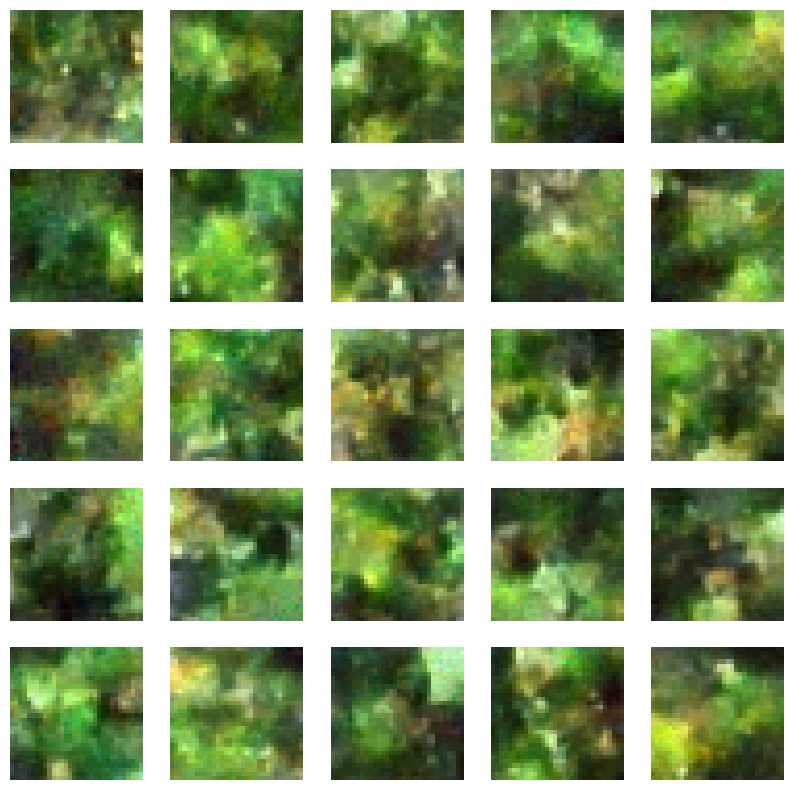

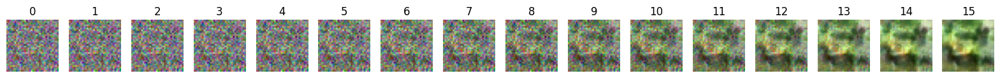

100%|██████████| 32/32 [00:02<00:00, 12.70it/s]


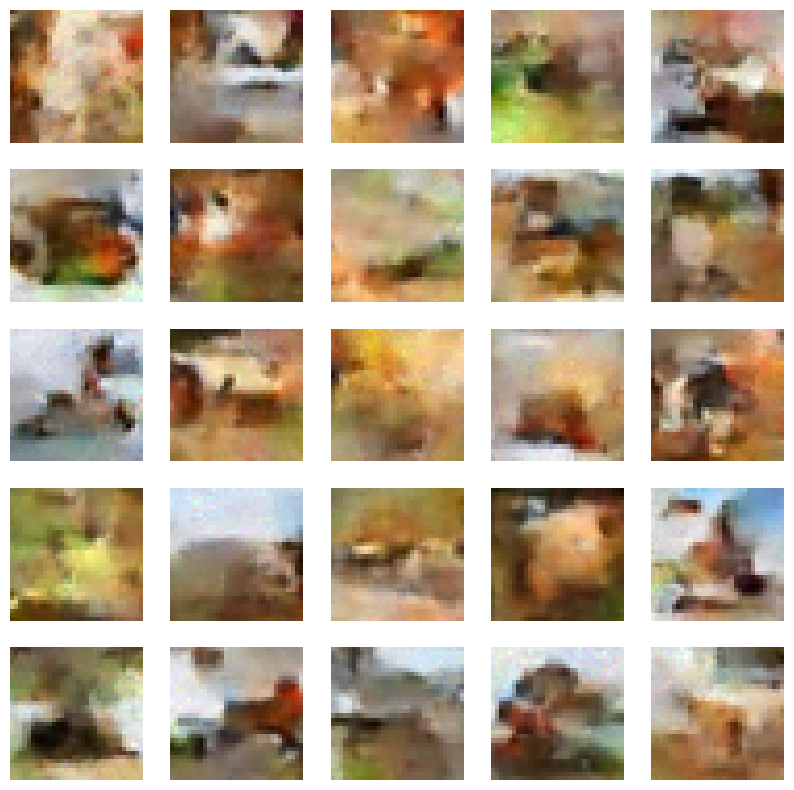

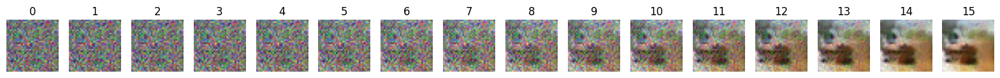

100%|██████████| 32/32 [00:02<00:00, 12.70it/s]


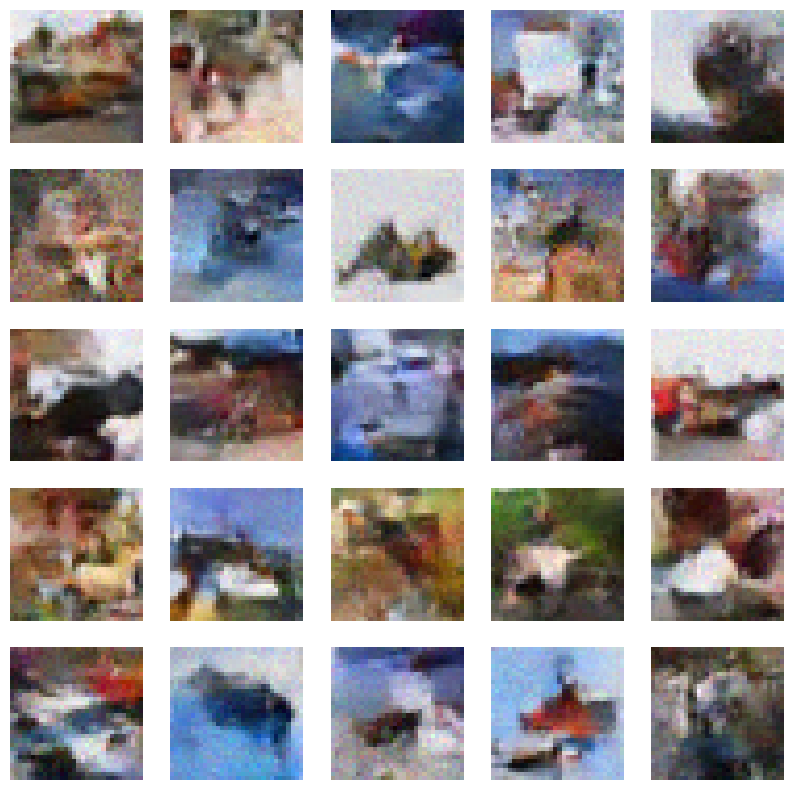

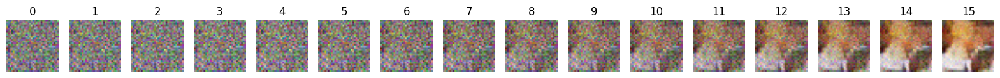

100%|██████████| 32/32 [00:02<00:00, 12.64it/s]


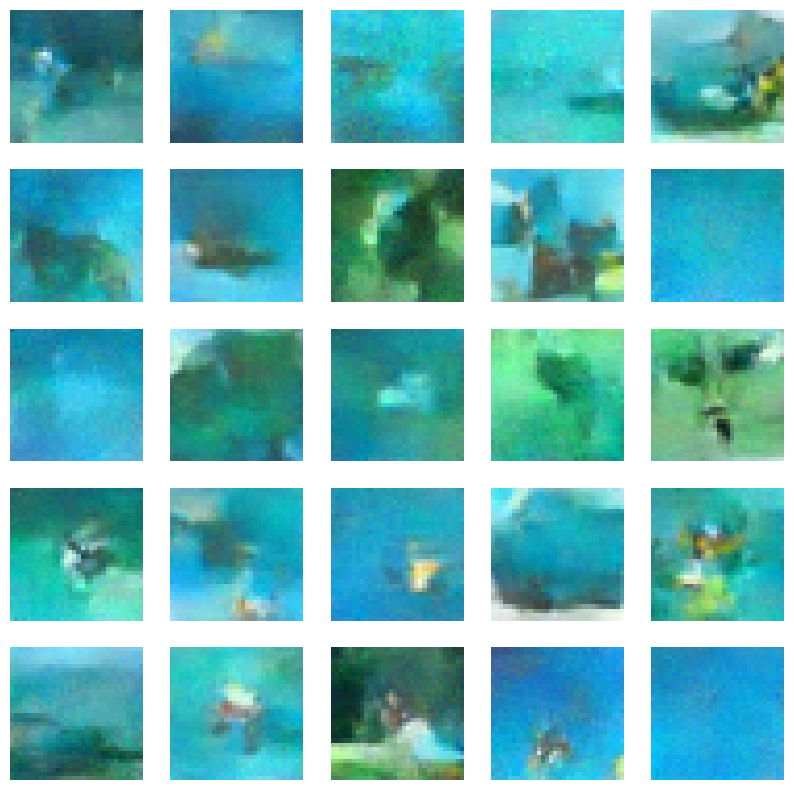

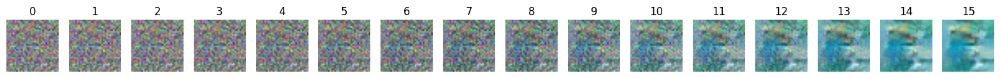

100%|██████████| 32/32 [00:02<00:00, 12.70it/s]


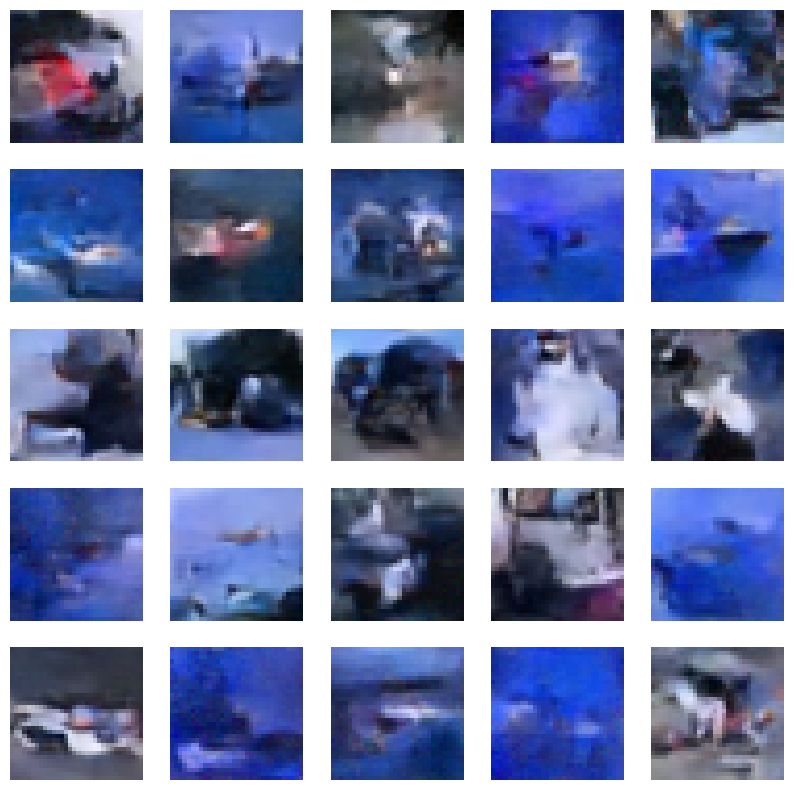

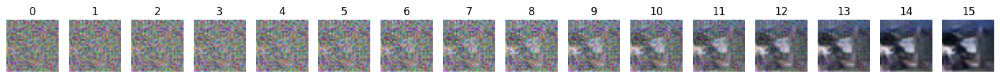

100%|██████████| 32/32 [00:02<00:00, 12.67it/s]


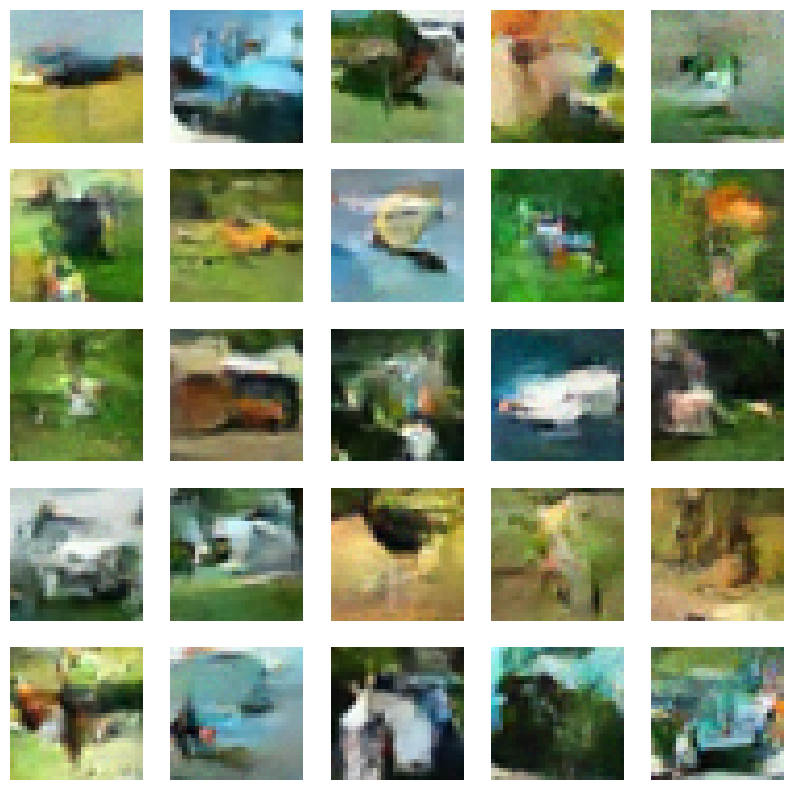

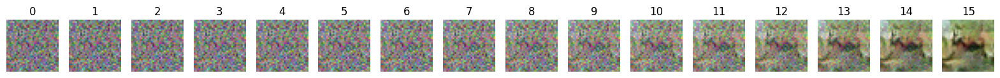

100%|██████████| 32/32 [00:02<00:00, 12.70it/s]


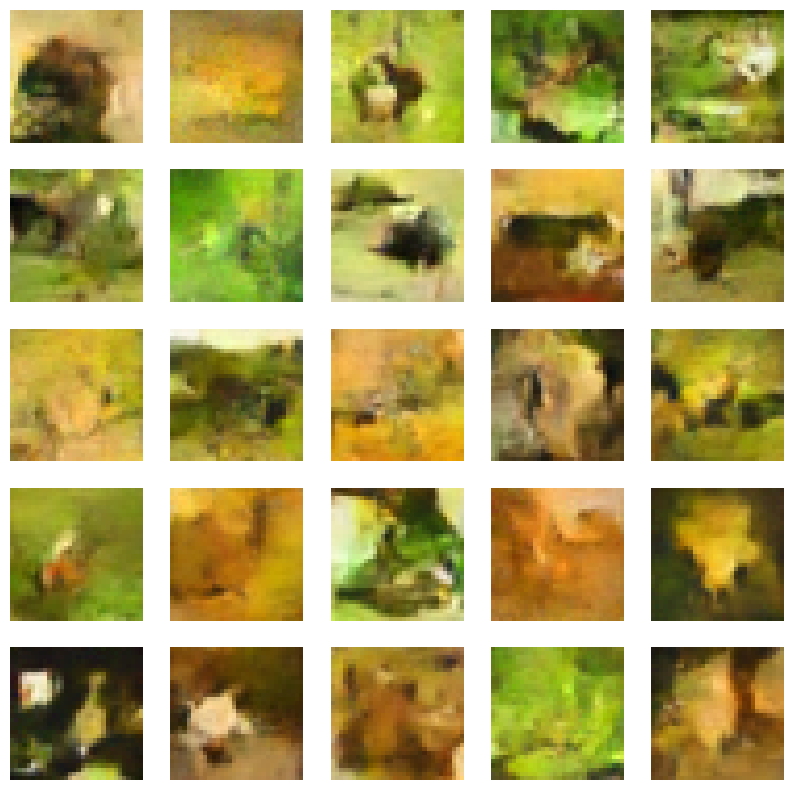

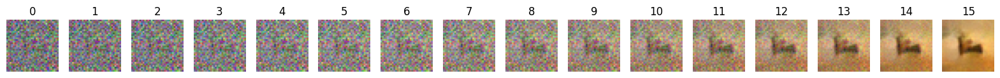

100%|██████████| 32/32 [00:03<00:00, 10.51it/s]


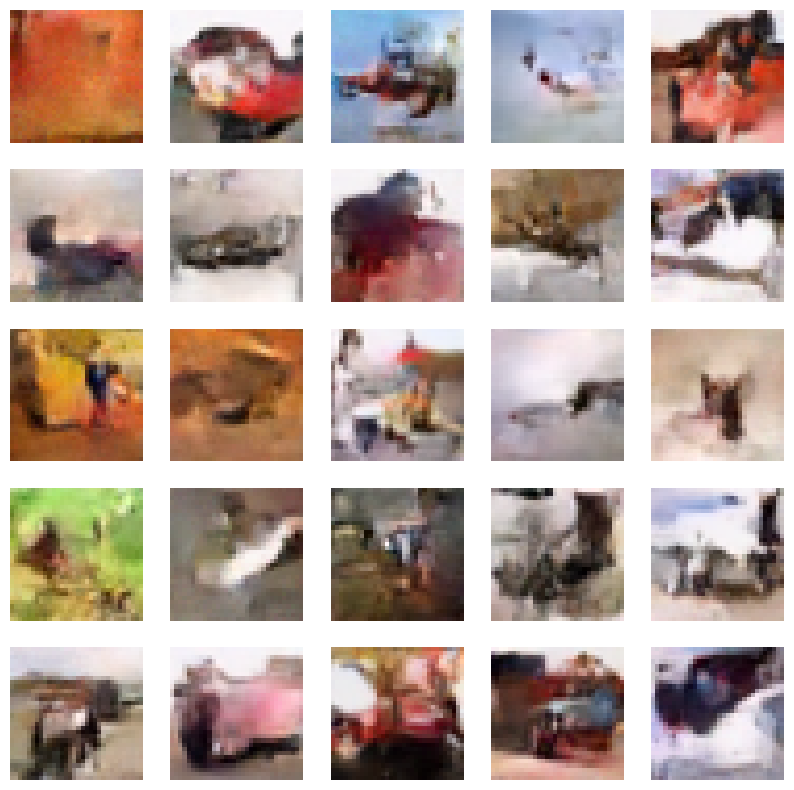

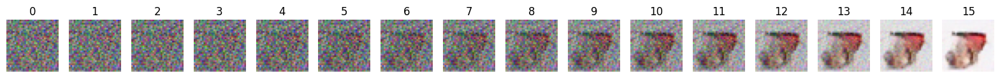

100%|██████████| 32/32 [00:02<00:00, 12.70it/s]


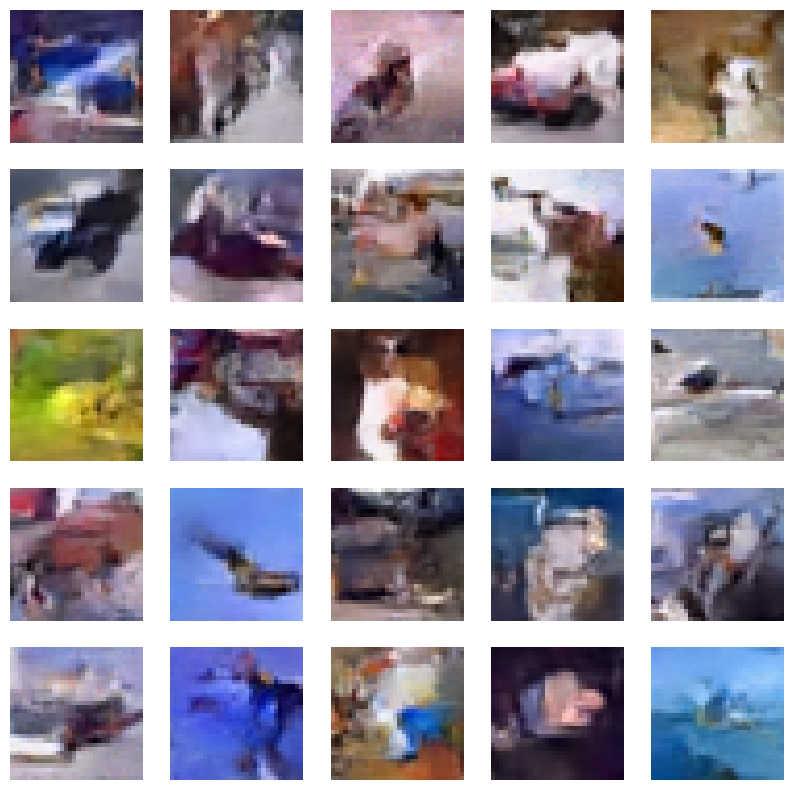

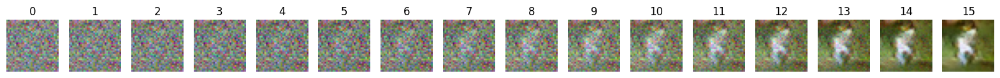

100%|██████████| 32/32 [00:02<00:00, 12.12it/s]


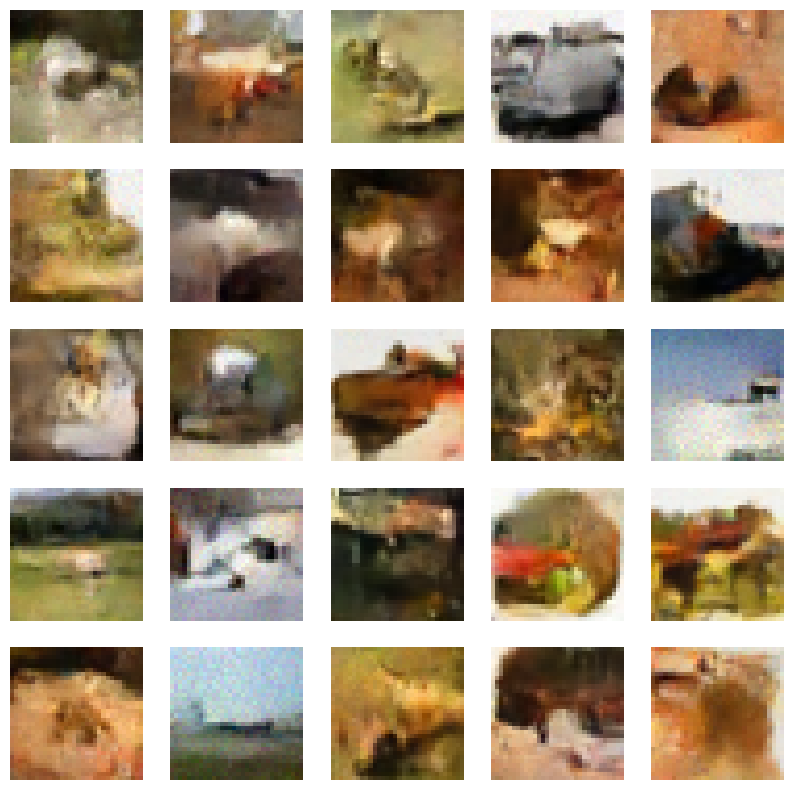

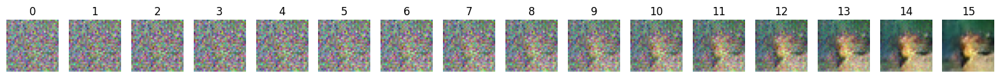

In [51]:
for _ in range(10):
    train()
    # reduce learning rate for next training
    model.optimizer.learning_rate = max(0.000001, model.optimizer.learning_rate * 0.9)

    # show result 
    predict()
    predict_step()
    plt.show()